# Example of extracting table data from Microsoft PPT documents

## Install spark-ocr python packge
Need specify path to `spark-ocr-assembly-[version].jar` or `secret`

In [1]:
secret = ""
license = ""
version = secret.split("-")[0]
spark_ocr_jar_path = "../../target/scala-2.11"

In [ ]:
import os
import sys

if AWS_ACCESS_KEY_ID != "":
    os.environ["AWS_ACCESS_KEY_ID"] = AWS_ACCESS_KEY_ID
    os.environ["AWS_SECRET_ACCESS_KEY"] = AWS_SECRET_ACCESS_KEY
    
if license:
    os.environ['JSL_OCR_LICENSE'] = license
    
if 'google.colab' in sys.modules:
  os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
  os.environ["PATH"] = os.environ["JAVA_HOME"] + "/bin:" + os.environ["PATH"]

In [2]:
%%bash
if python -c 'import google.colab' &> /dev/null; then
    echo "Run on Google Colab!"
    echo "Install Open JDK"
    apt-get install -y openjdk-8-jdk-headless -qq > /dev/null
    java -version
fi

In [2]:
import os
import sys

if 'google.colab' in sys.modules:
  os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
  os.environ["PATH"] = os.environ["JAVA_HOME"] + "/bin:" + os.environ["PATH"]

In [4]:
# install from PYPI using secret
#%pip install spark-ocr==$version+spark30 --extra-index-url=https://pypi.johnsnowlabs.com/$secret --upgrade

In [ ]:
# or install from local path
#%pip install ../../python/dist/spark-ocr-3.8.0+spark30.tar.gz

## Initialization of spark session

In [ ]:
from sparkocr import start


spark = start(secret=secret, jar_path=spark_ocr_jar_path, nlp_version="3.1.3")

spark


In [5]:
spark.sparkContext.setLogLevel("ERROR")

## Import OCR transformers

In [6]:
from sparkocr.transformers import *
from sparkocr.utils import display_image
from pyspark.sql.functions import collect_list,col

## Read PPT document as binary file

In [7]:
import pkg_resources
ppt_example = pkg_resources.resource_filename('sparkocr', 'resources/ocr/ppt/37625.ppt')
ppt_example_df = spark.read.format("binaryFile").load(ppt_example).cache()

## Preview document using `PptToPdf` and `PdfToImage` transformers

In [9]:
from sparkocr.transformers import PptToPdf


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 2479 px
    Height: 3508 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


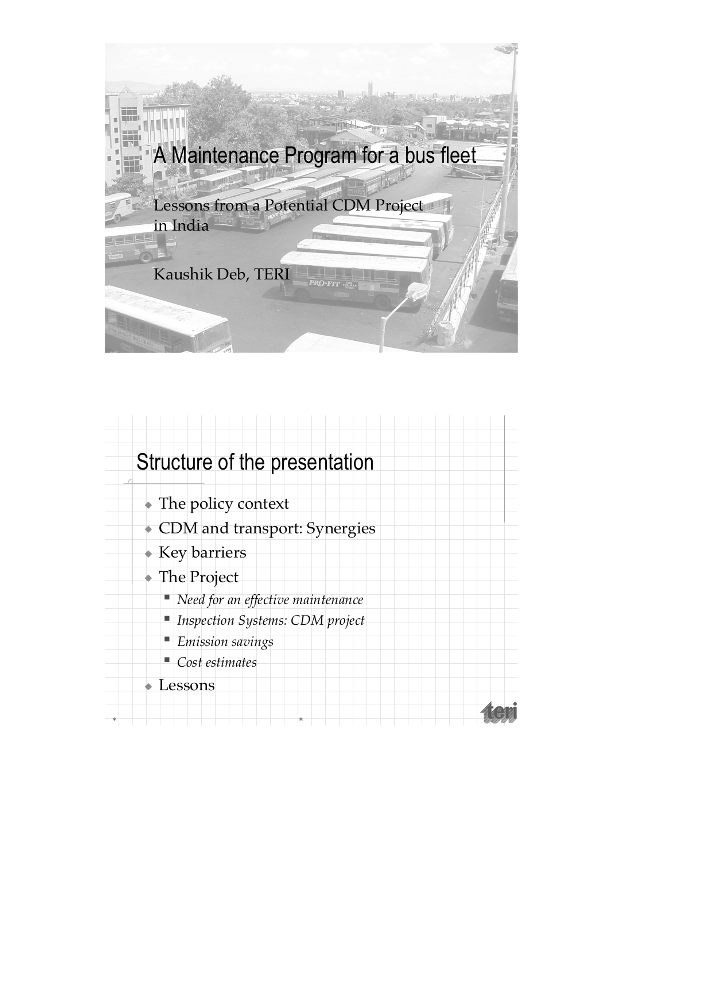


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


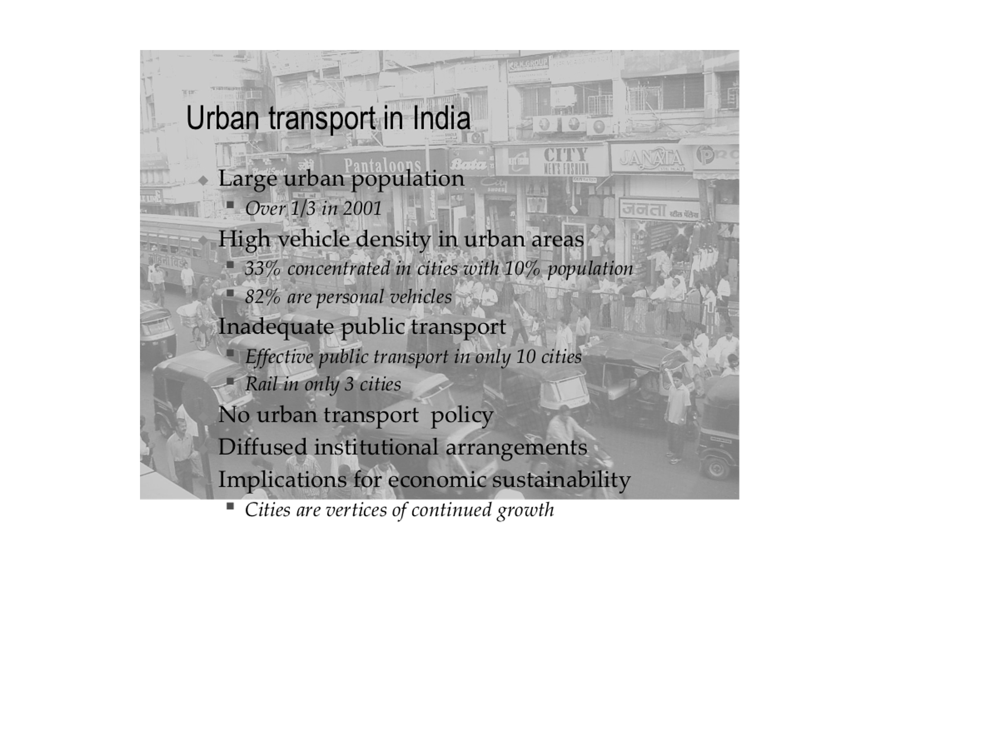


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


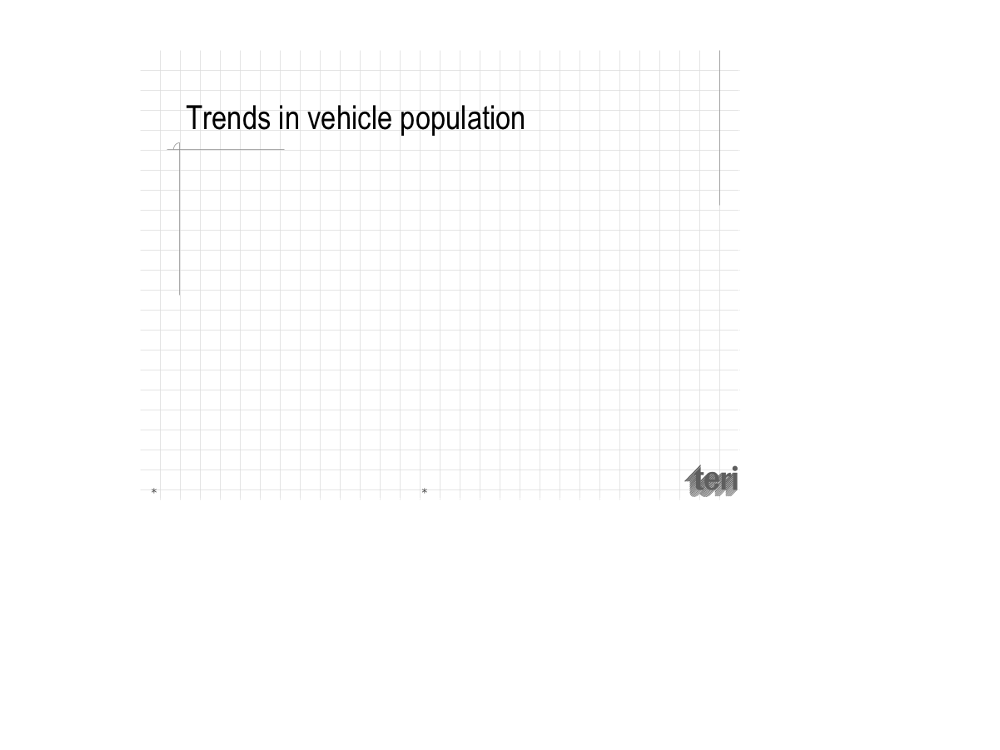


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


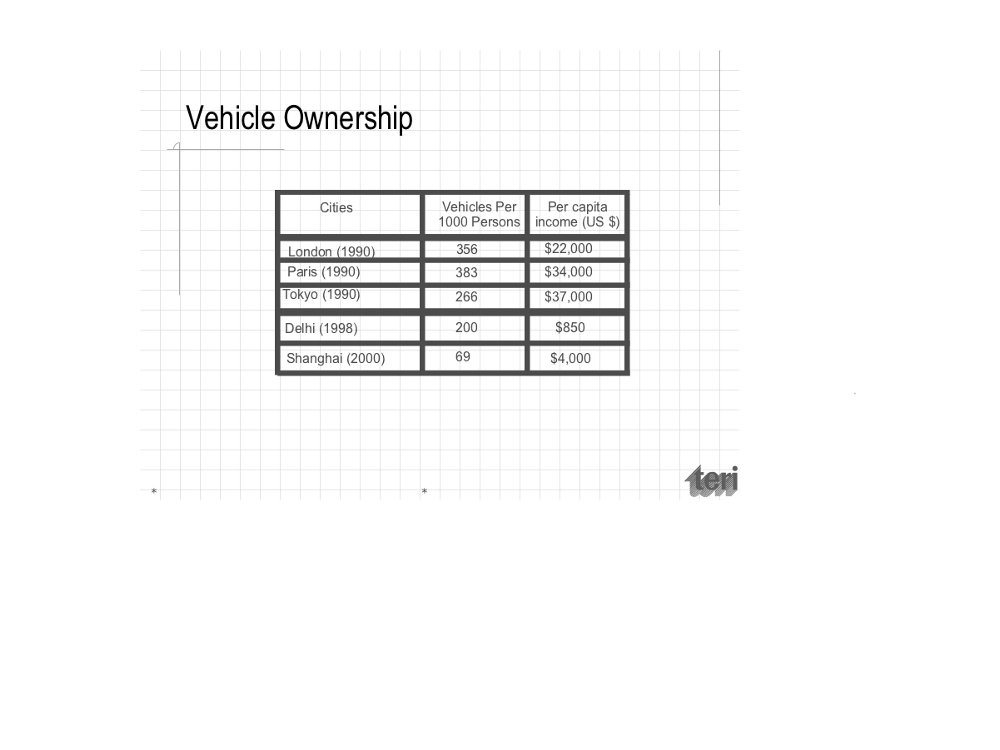


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


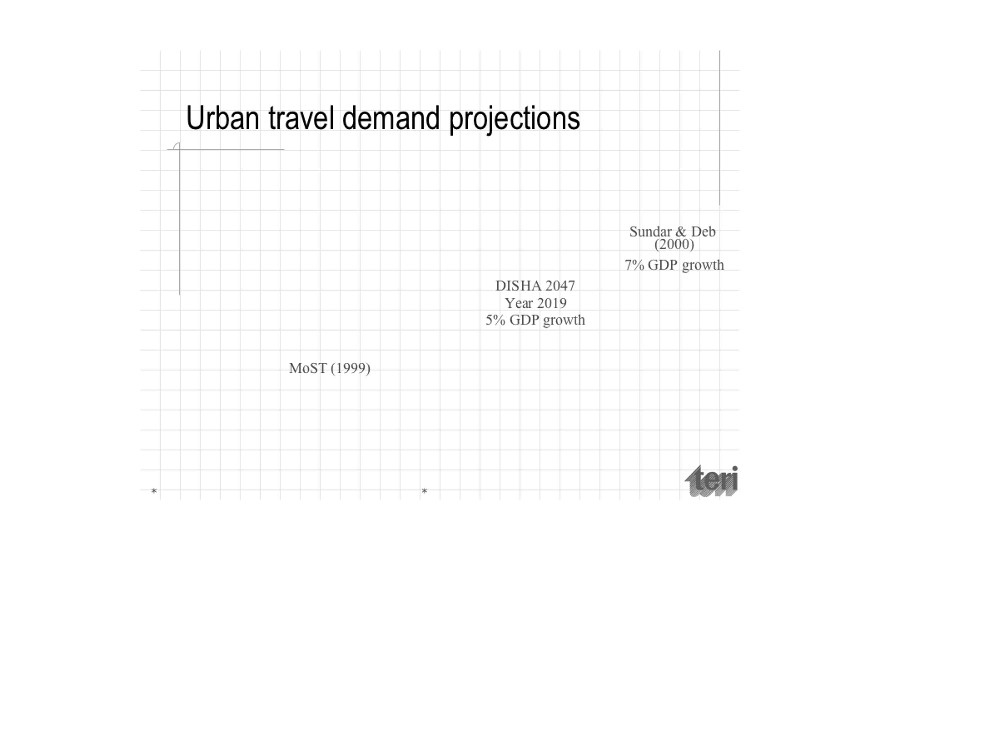


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


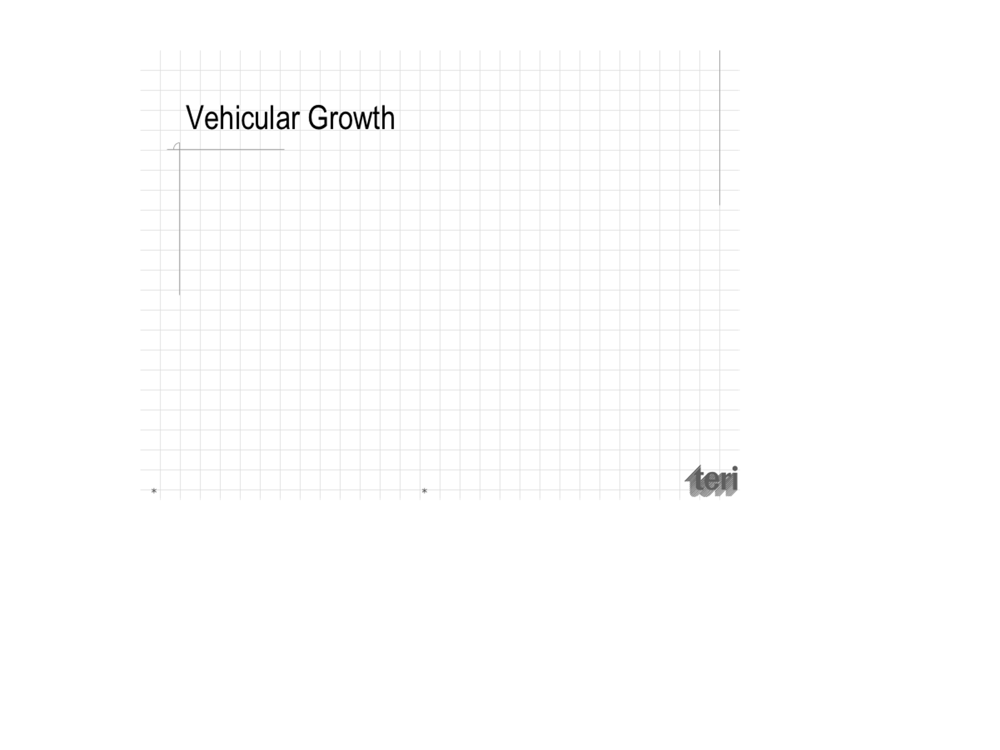


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


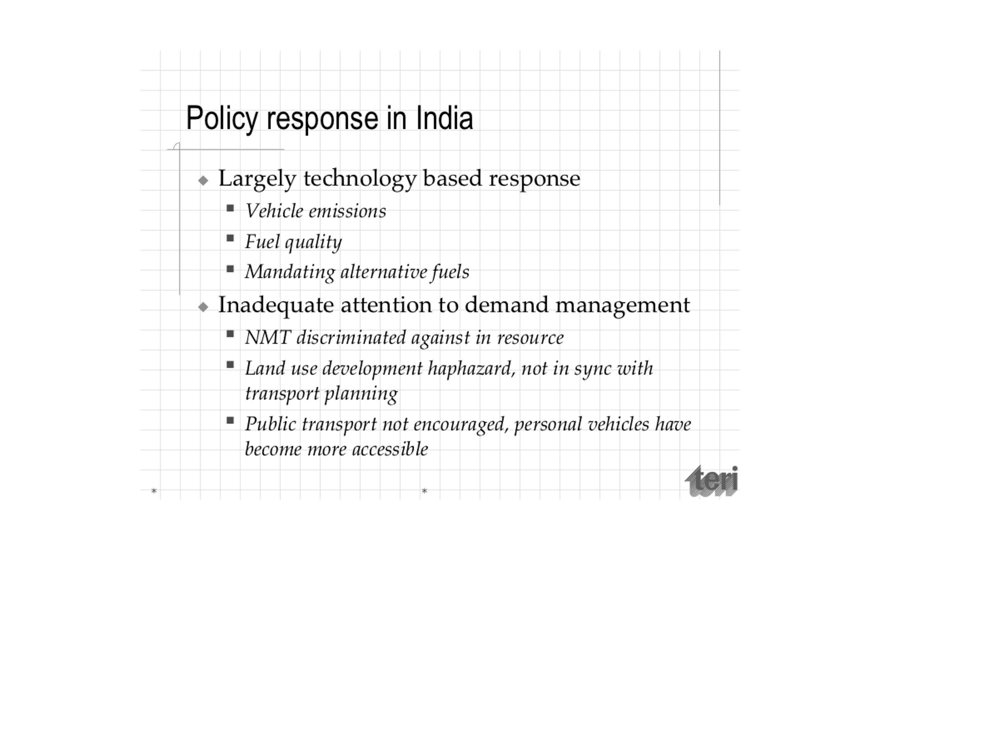


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


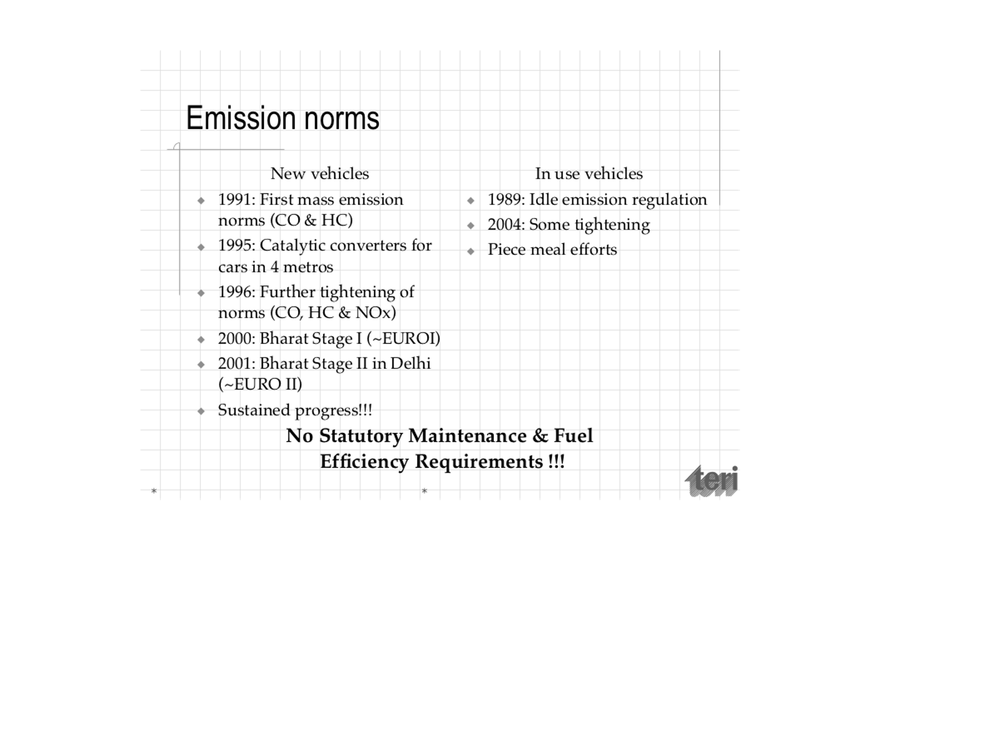


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


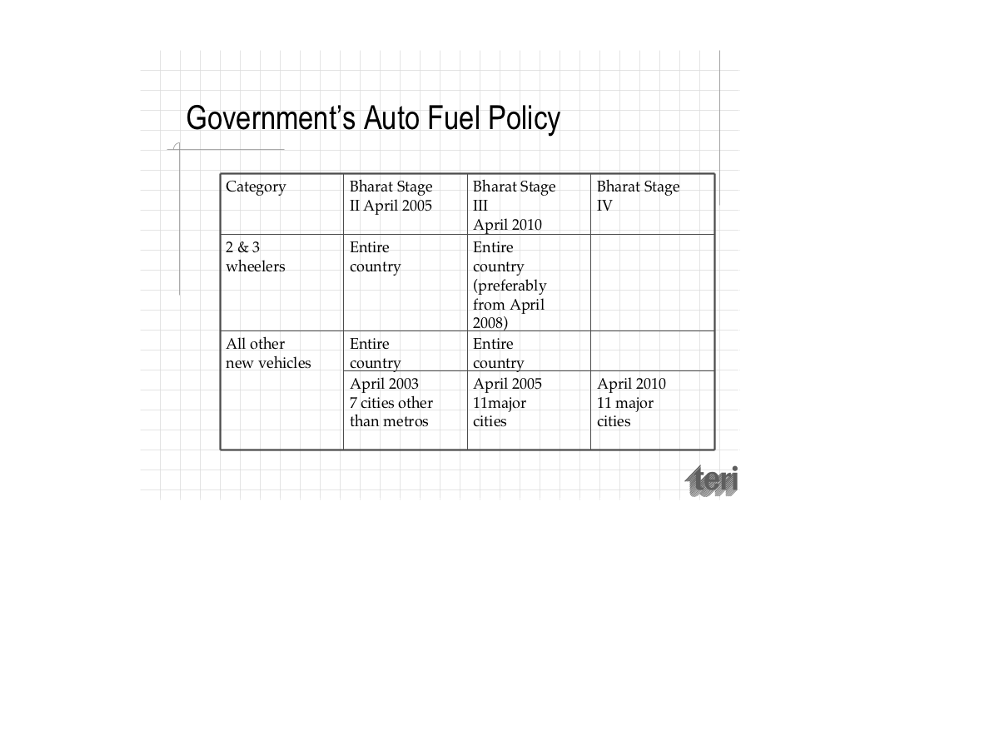


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


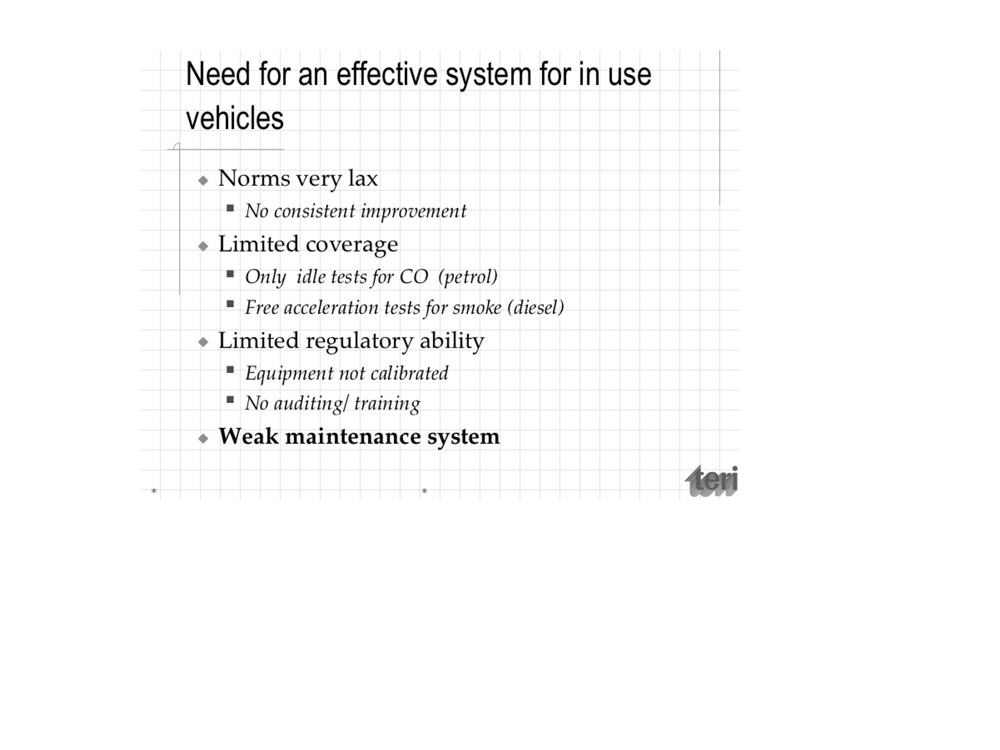


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


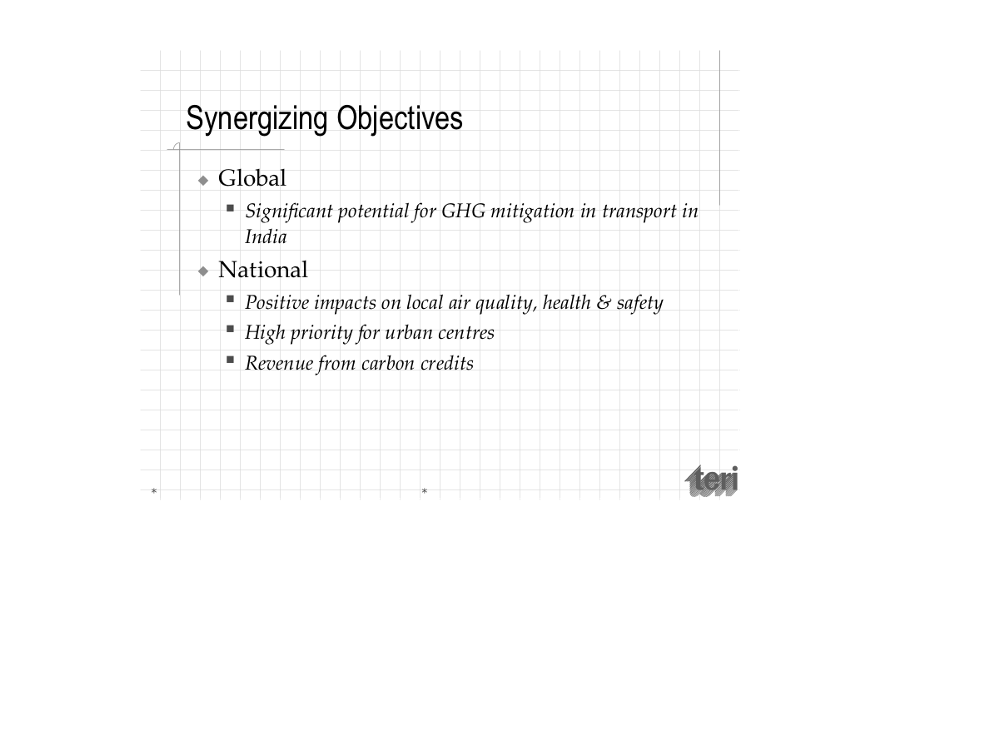


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


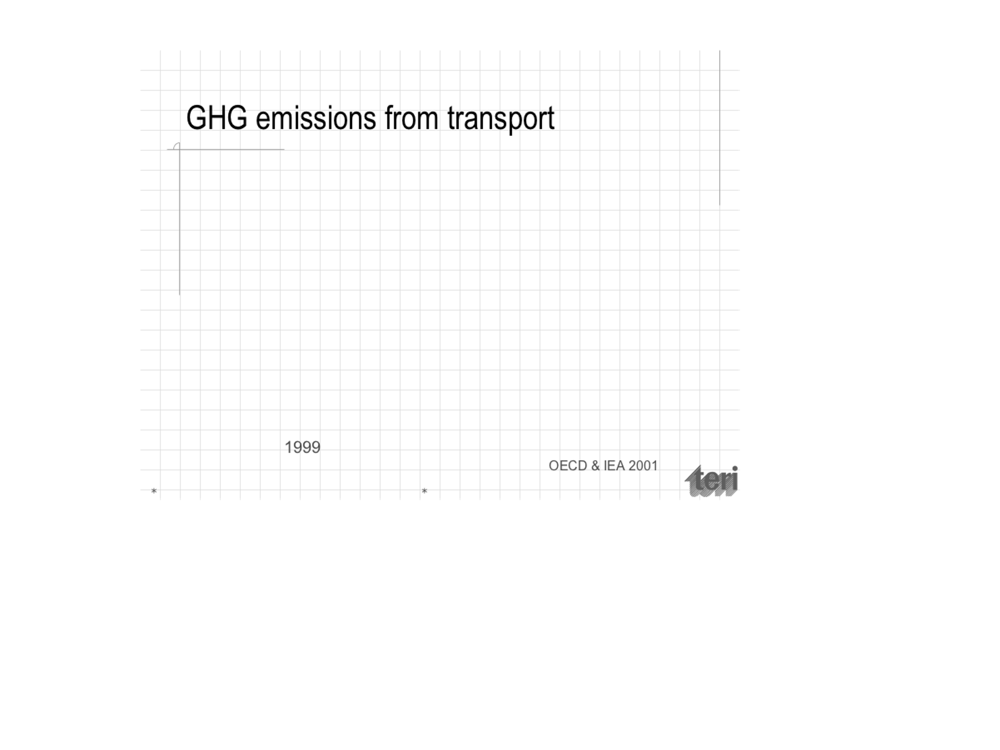


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


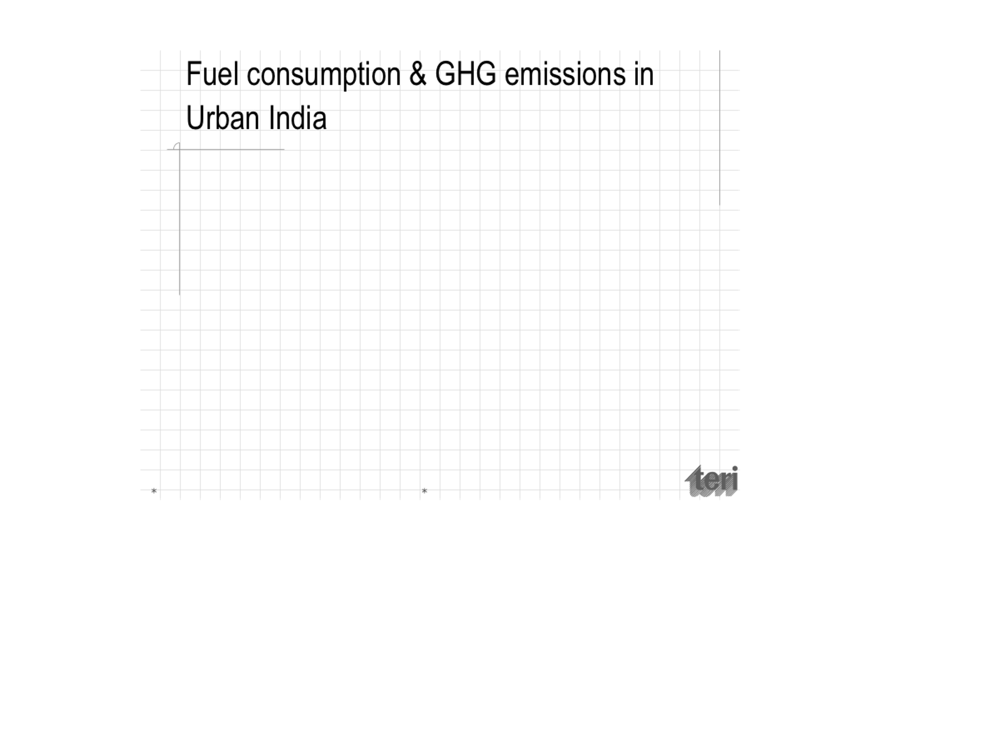


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


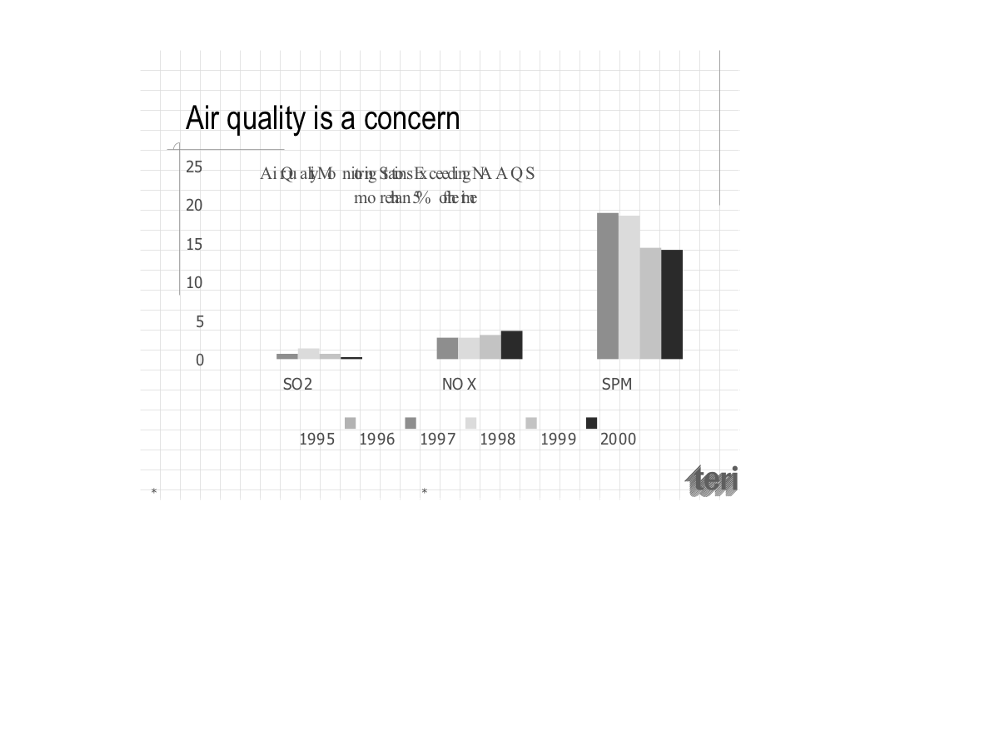


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


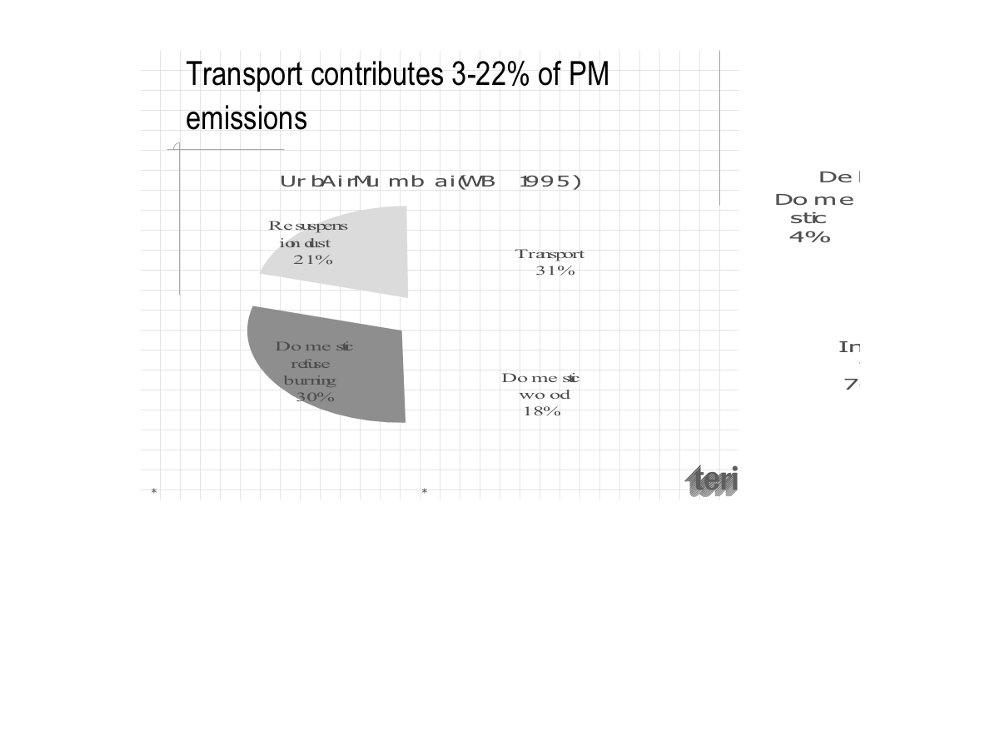


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


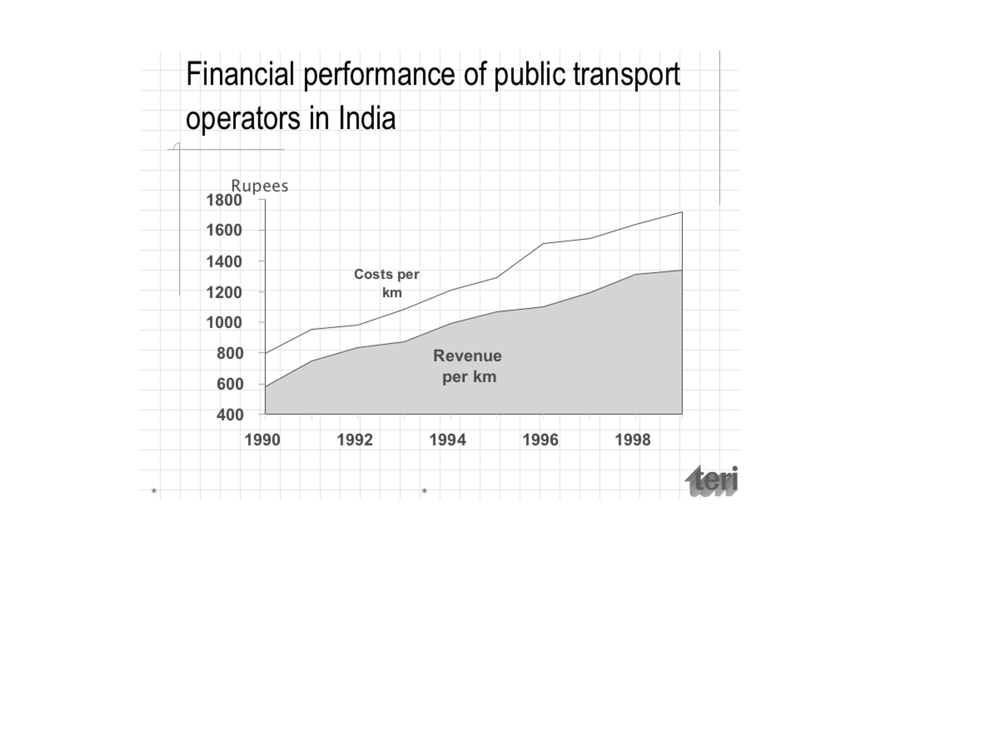


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


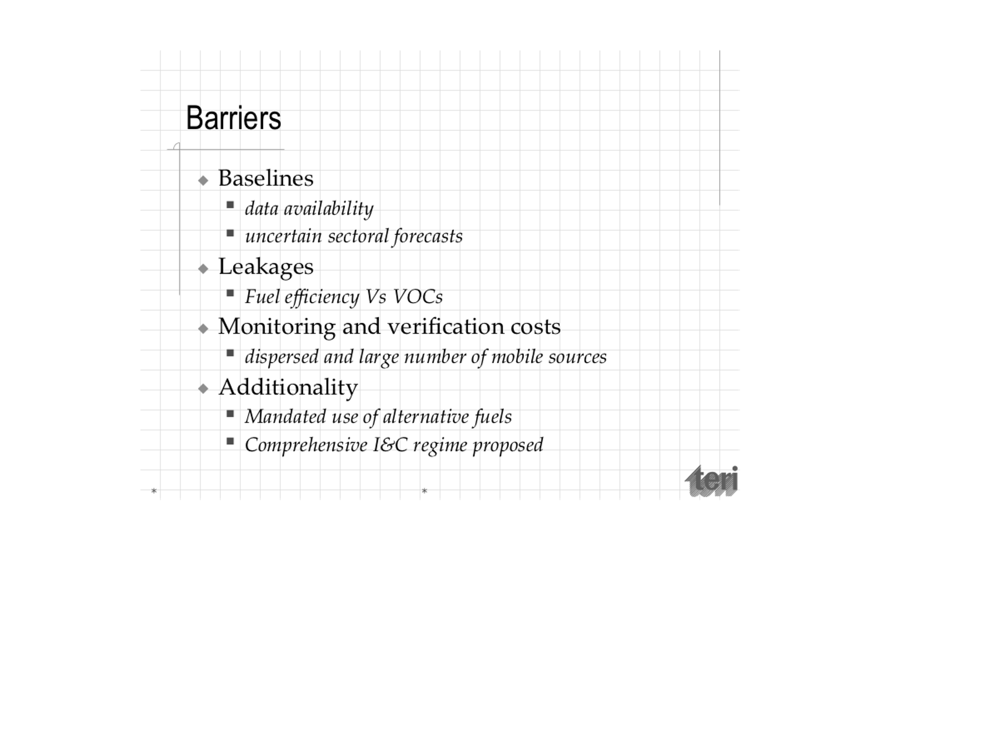


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


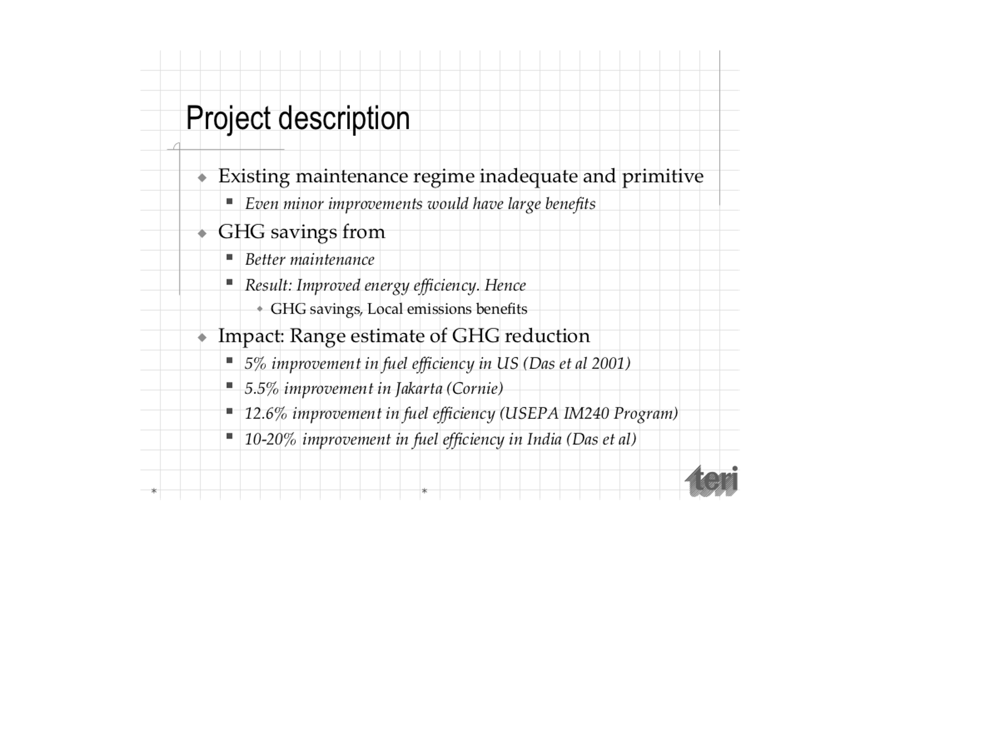


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


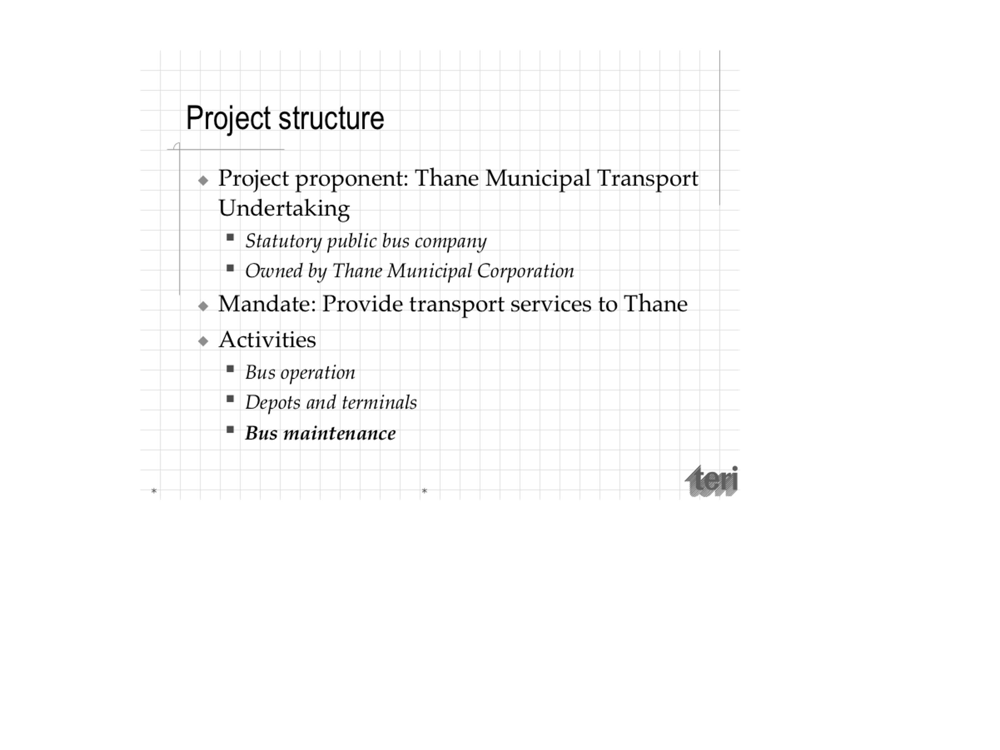


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


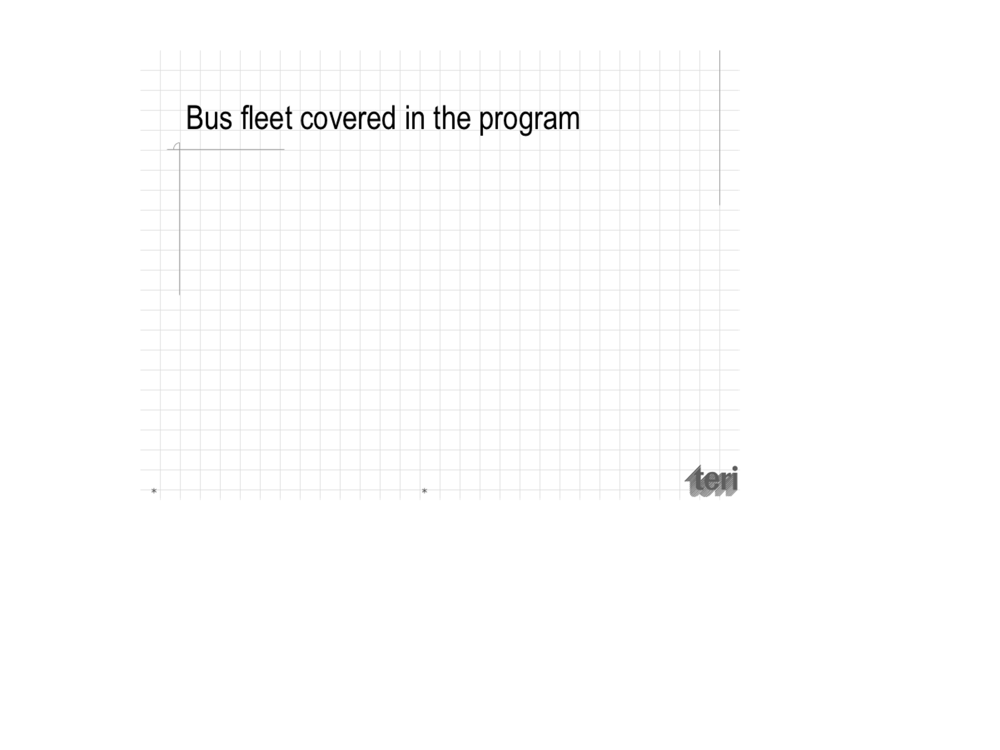


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


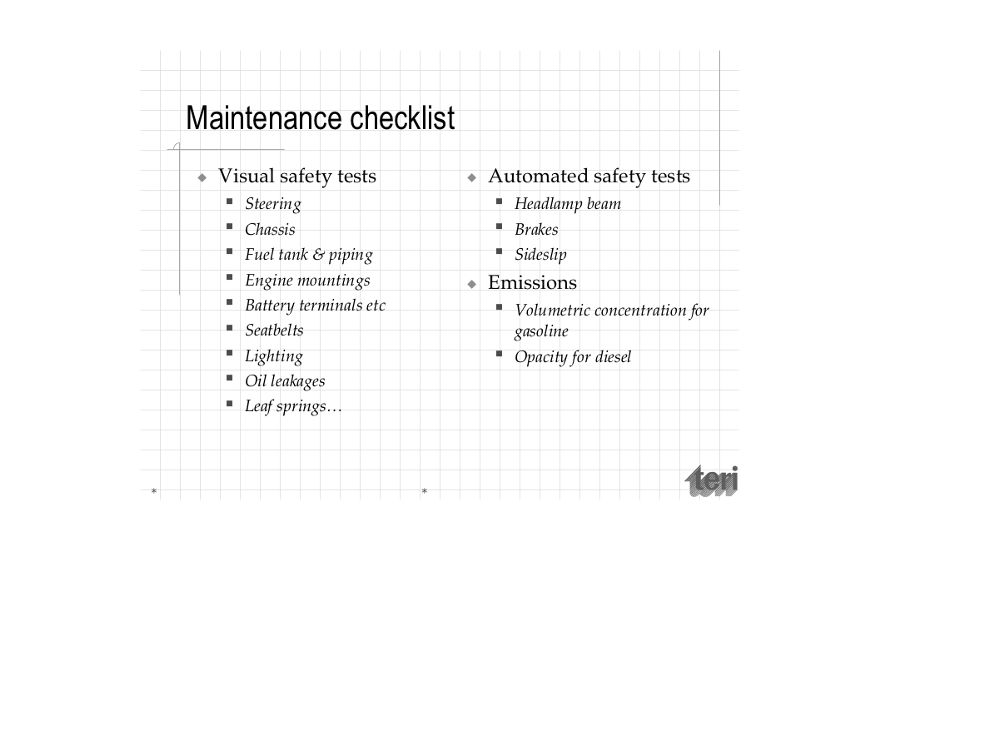


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


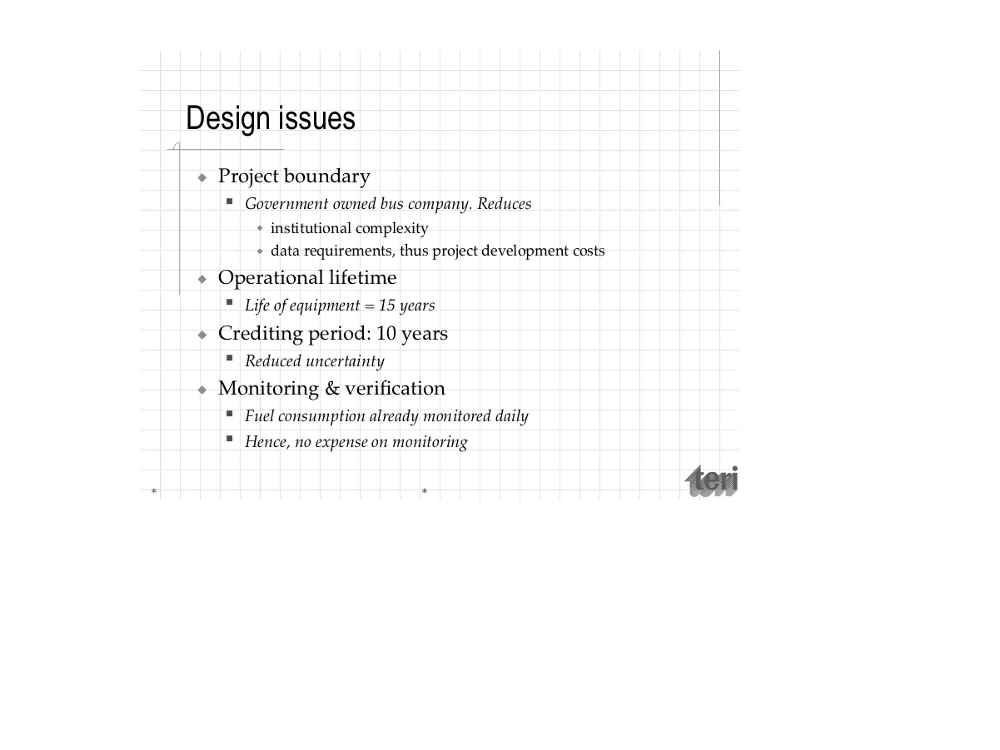


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


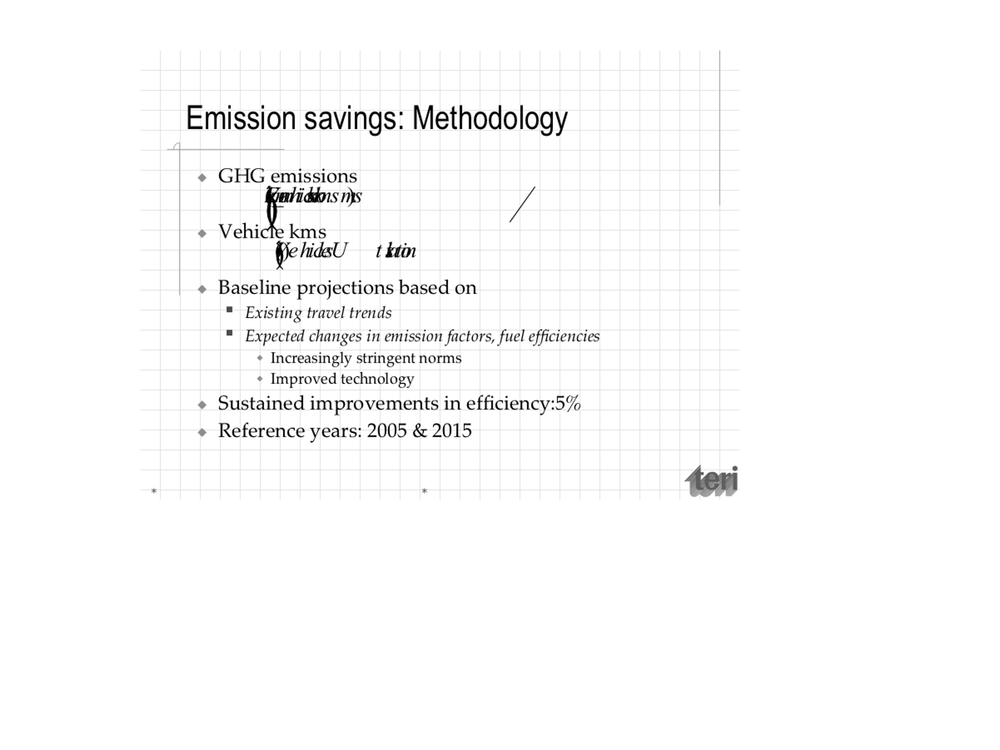


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


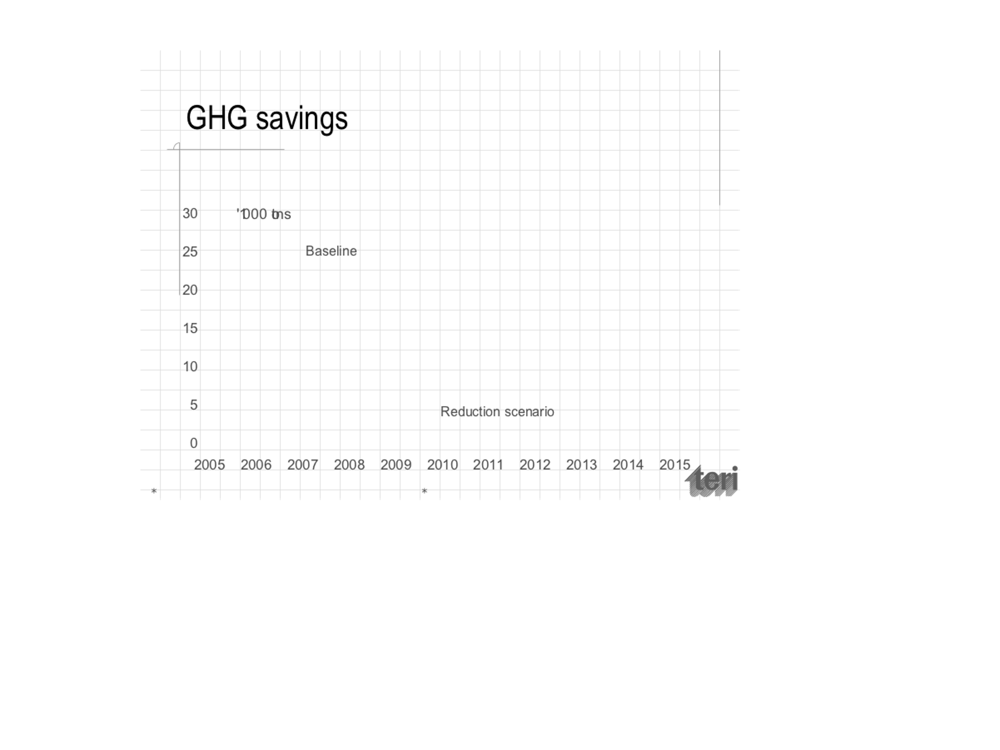


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


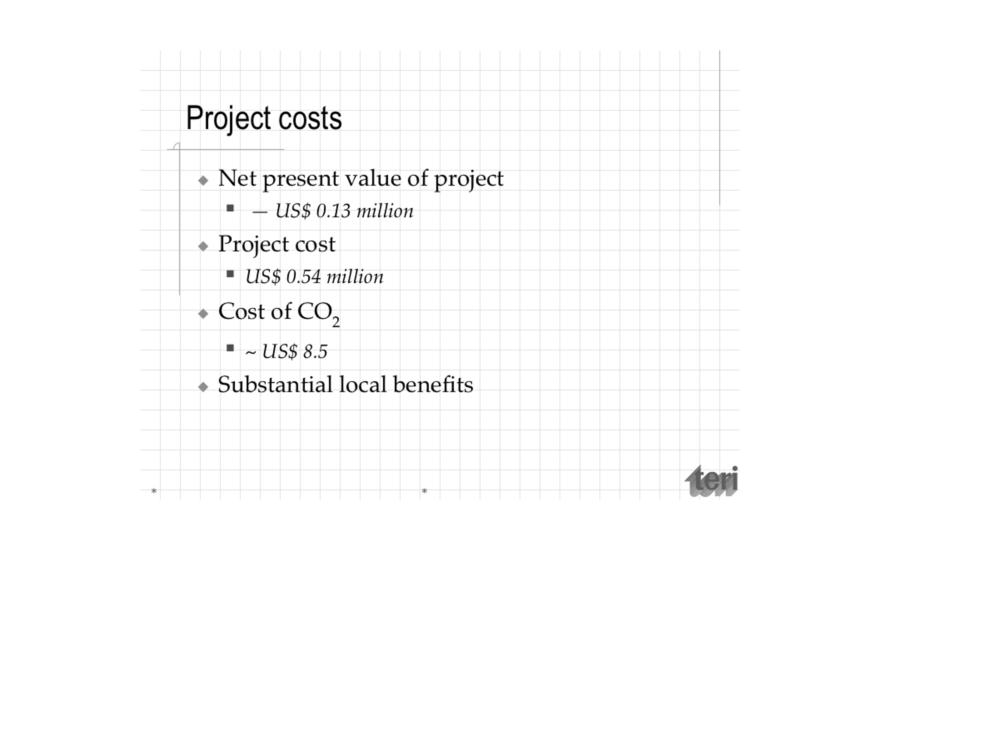


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


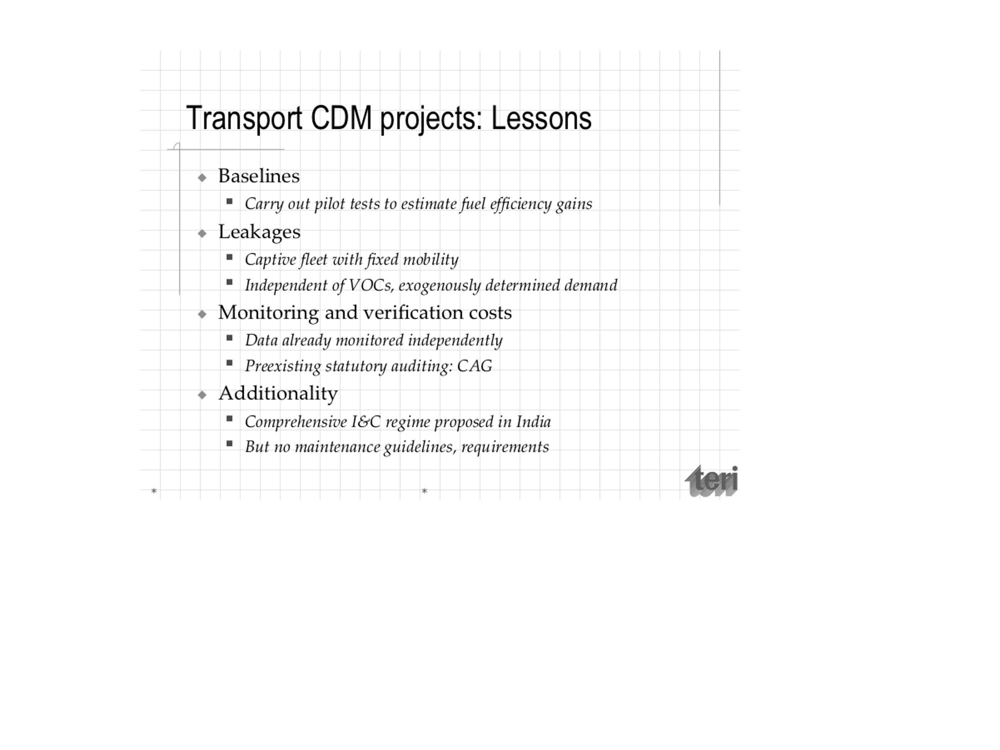


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


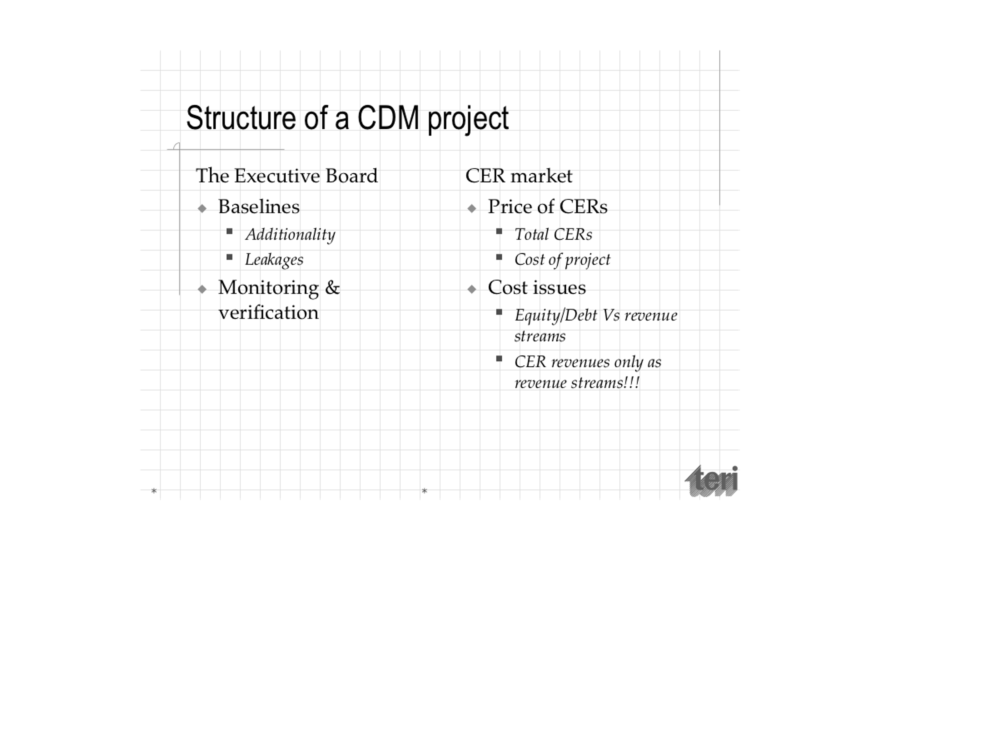


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.ppt
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


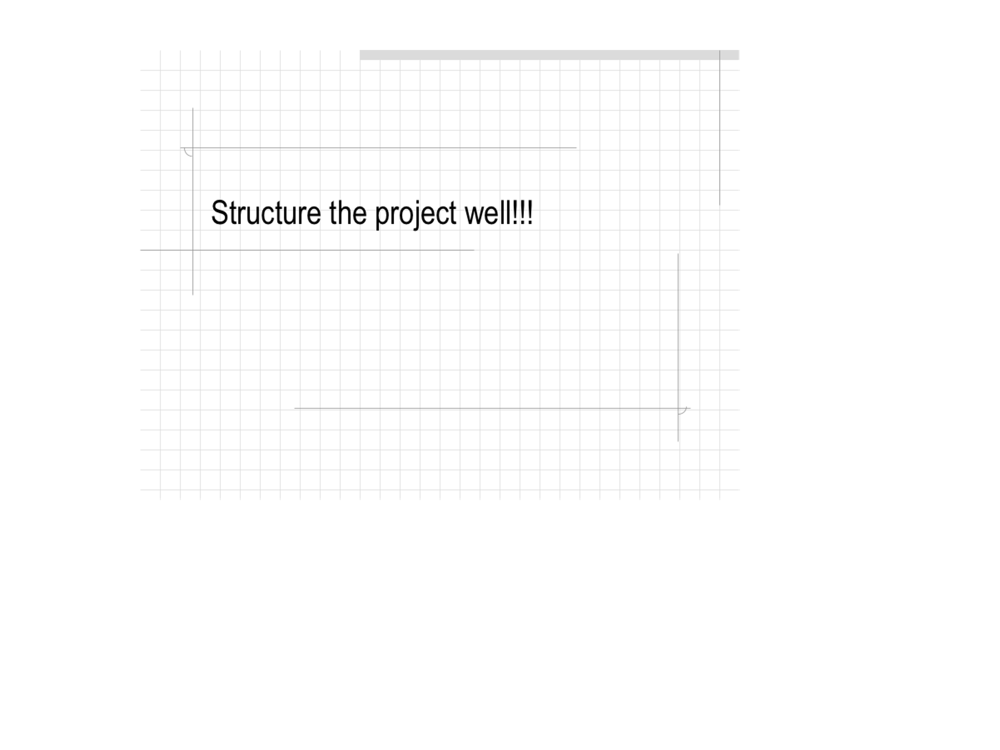

In [10]:
image_df = PdfToImage().transform(PptToPdf().setOutputCol("content").transform(ppt_example_df))
for r in image_df.select("image").collect():
    display_image(r.image)

## Read PPTX document as binary file

In [13]:
pptx_example = pkg_resources.resource_filename('sparkocr', 'resources/ocr/ppt/37625.pptx') #2411-Performance_Up
pptx_example_df = spark.read.format("binaryFile").load(pptx_example).cache()

## Preview document using `PptToPdf` and `PdfToImage` transformers


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 2479 px
    Height: 3508 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


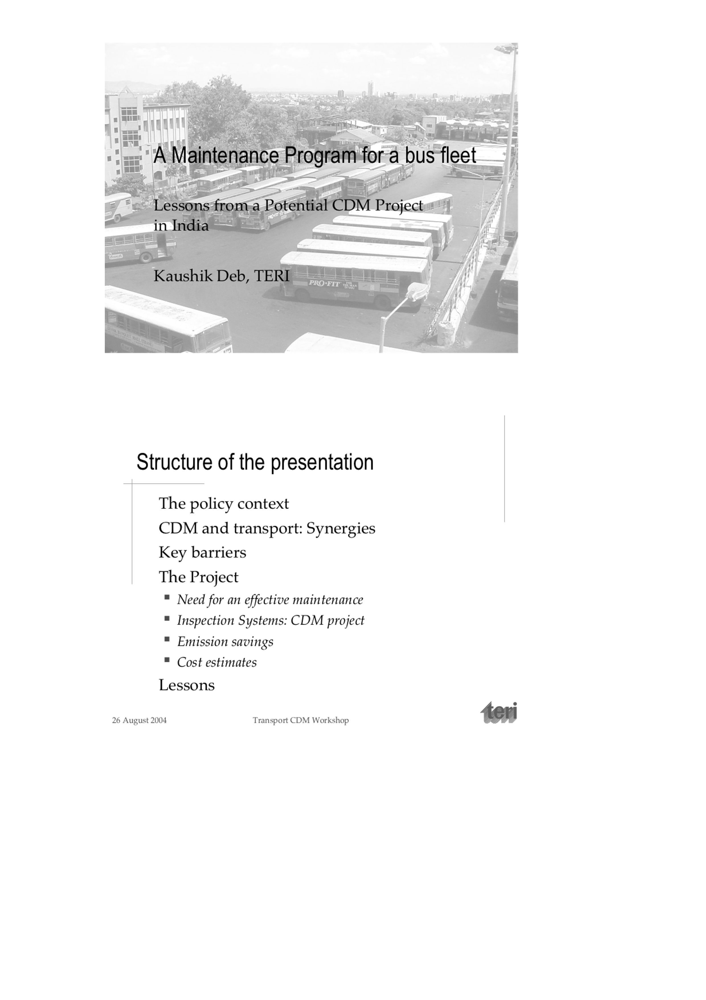


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


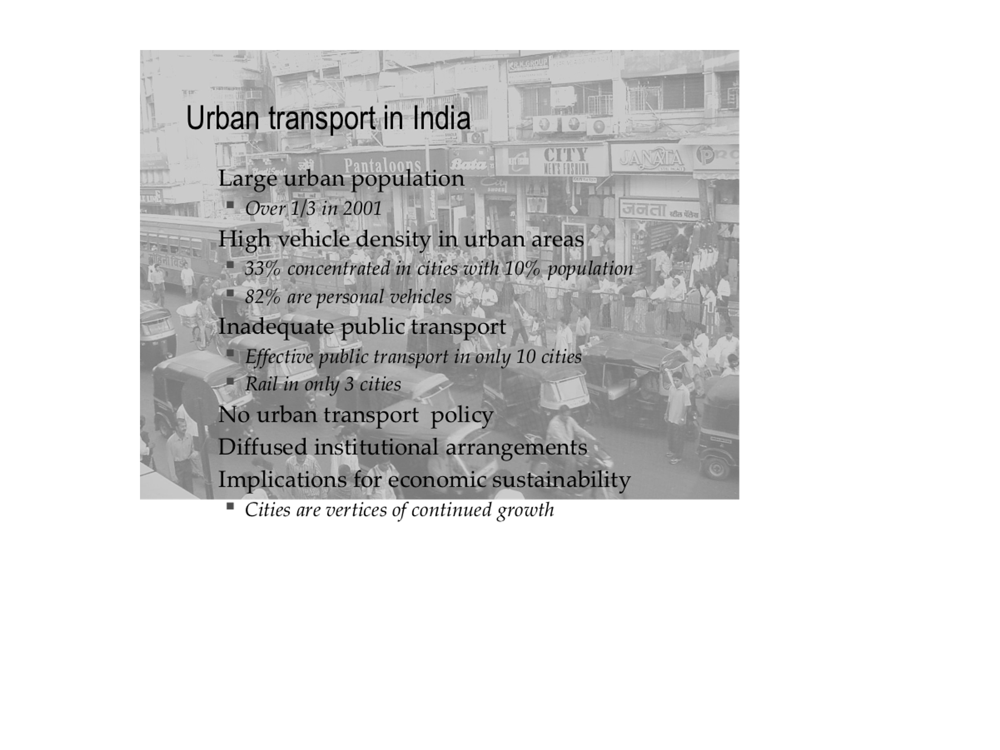


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


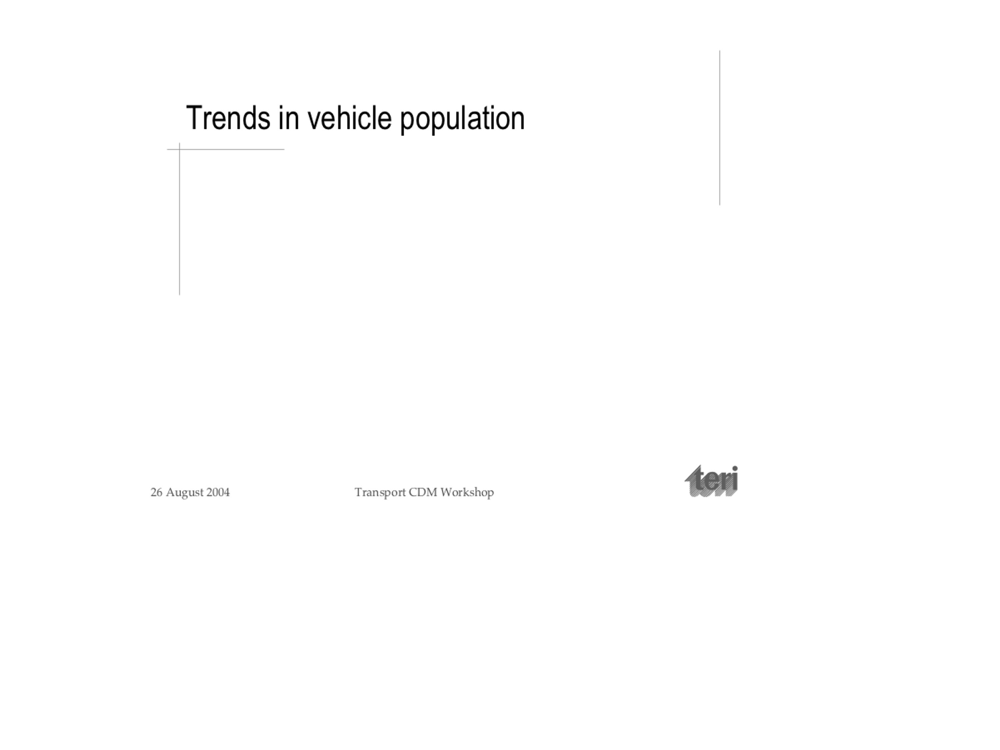


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


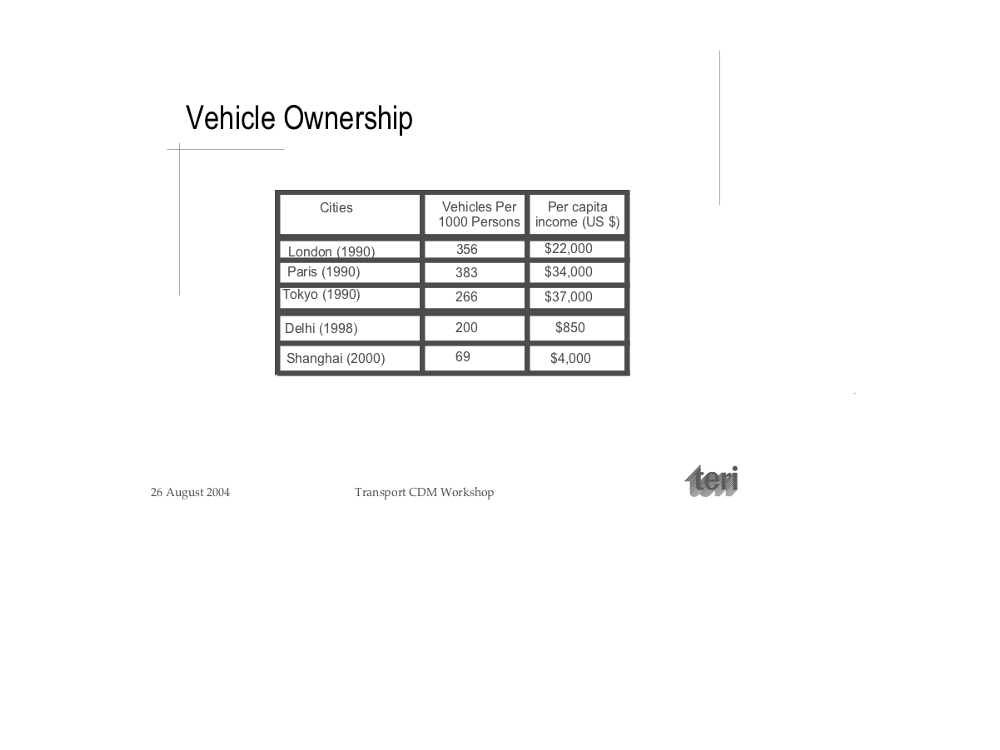


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


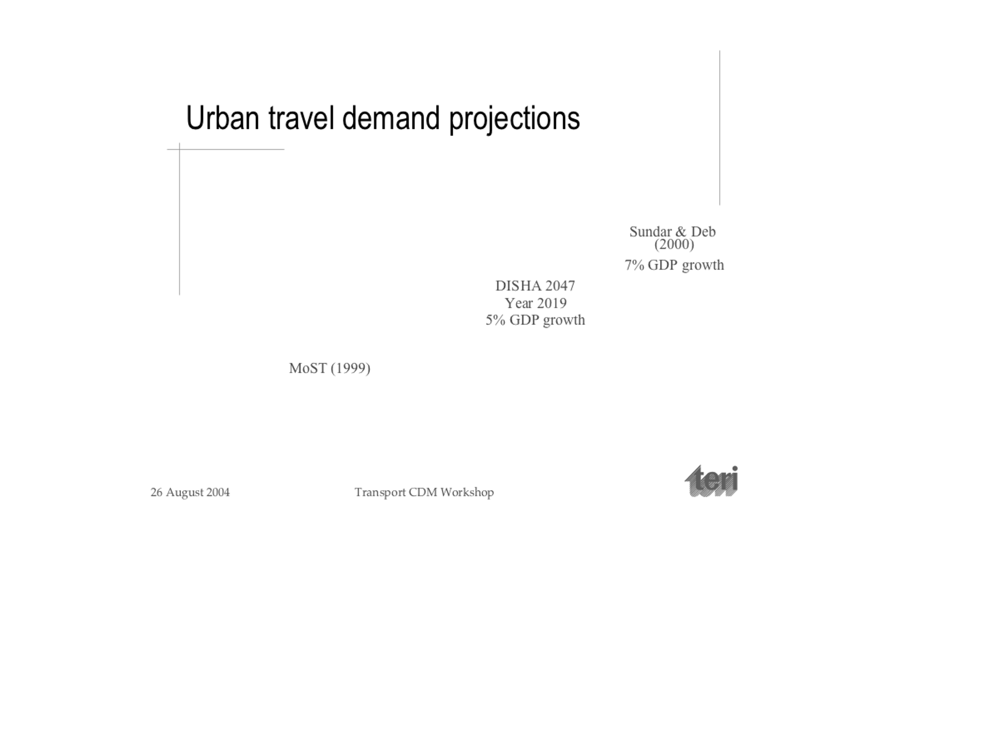


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


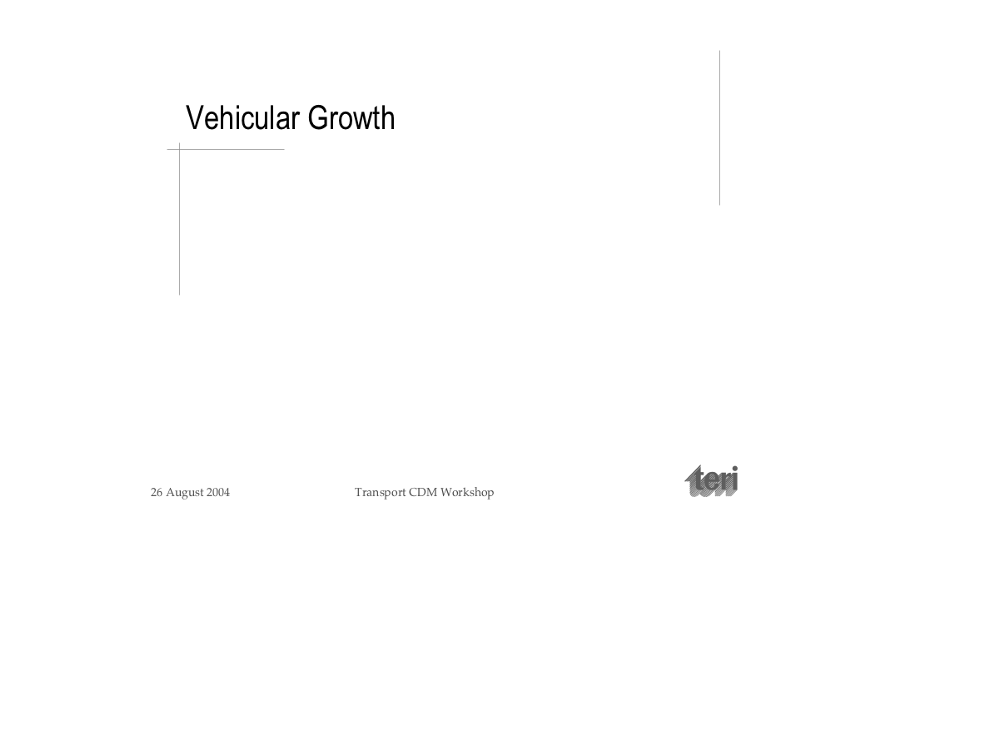


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


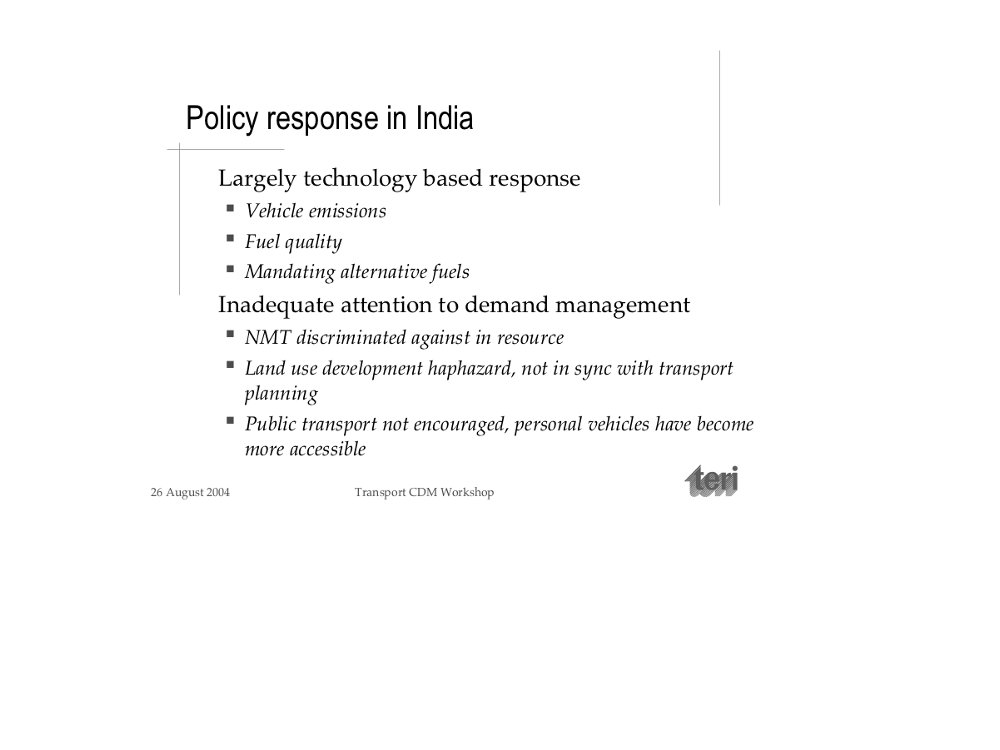


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


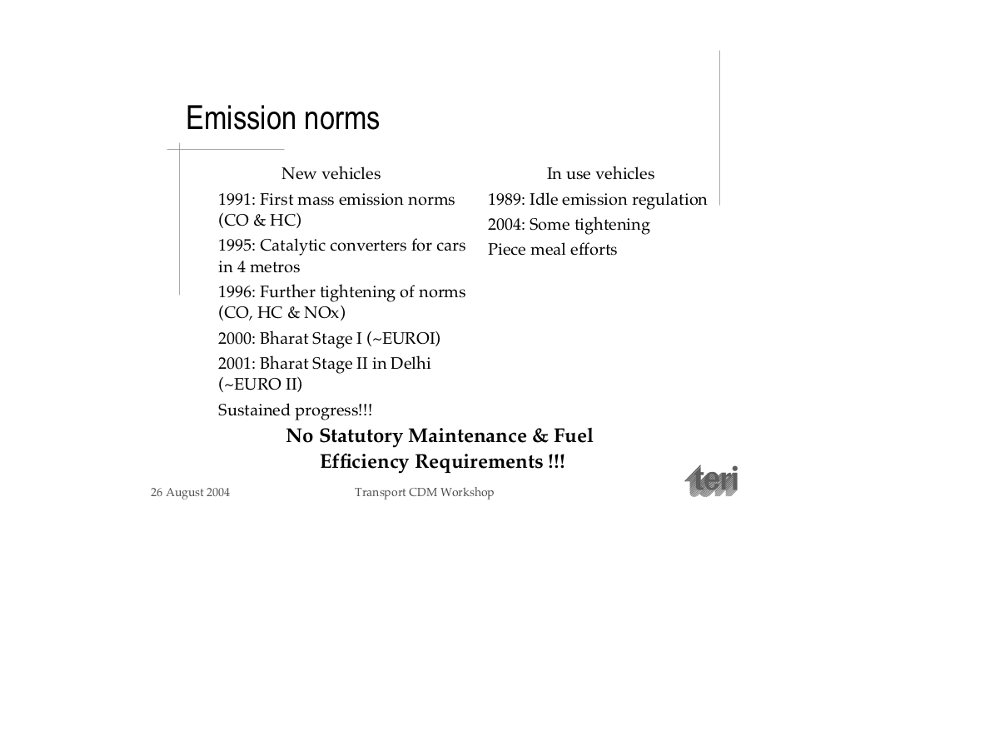


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


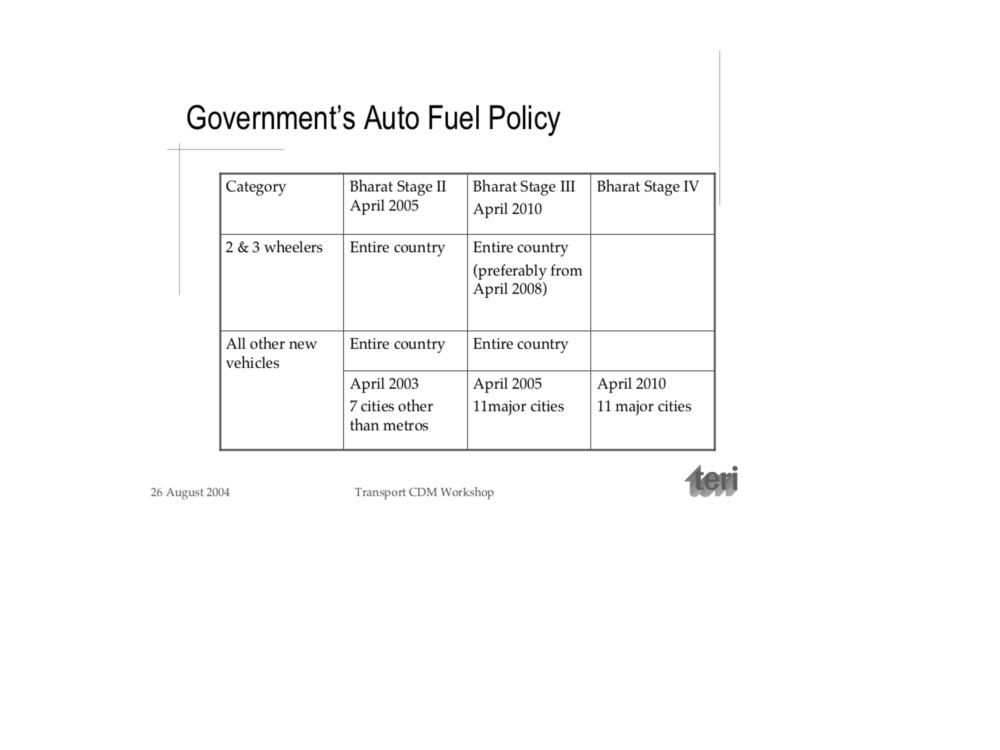


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


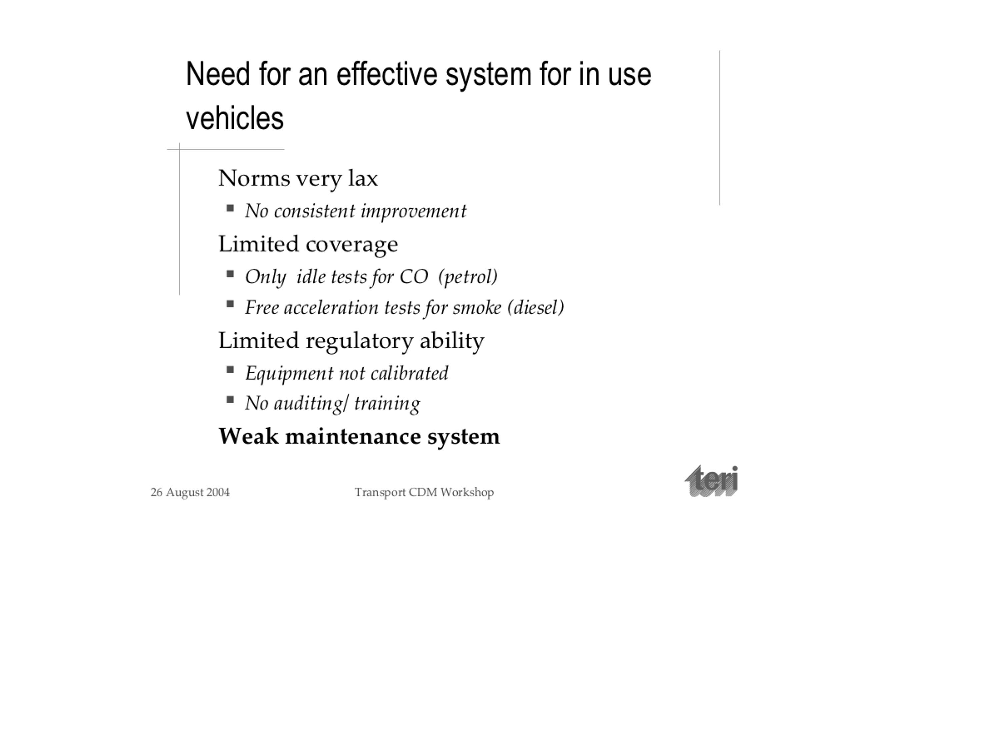


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


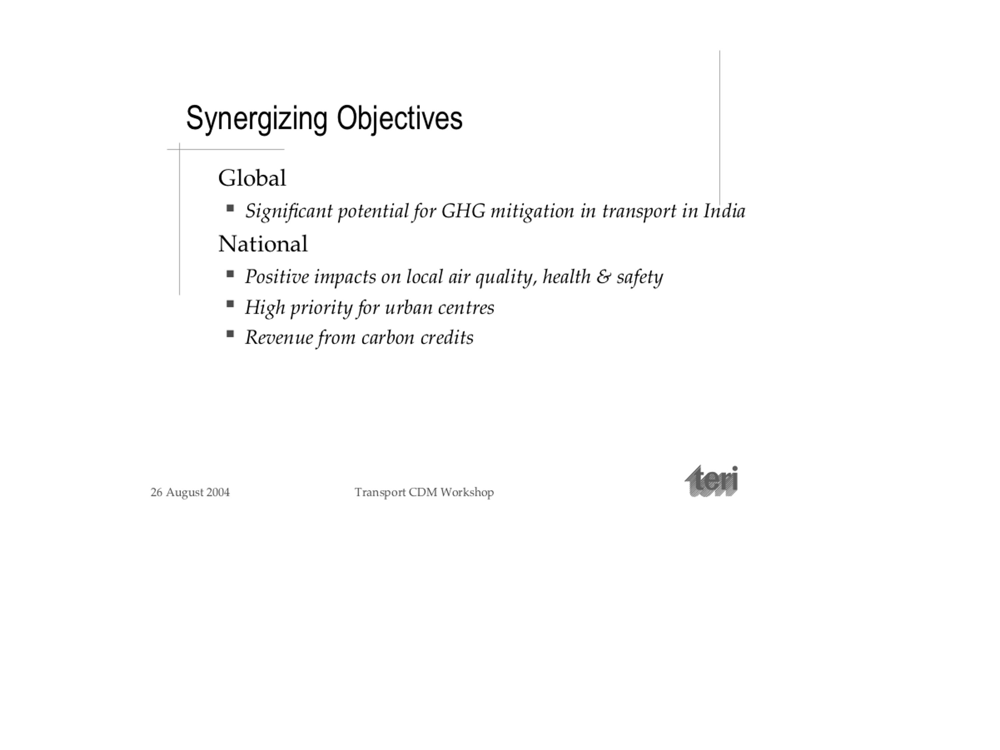


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


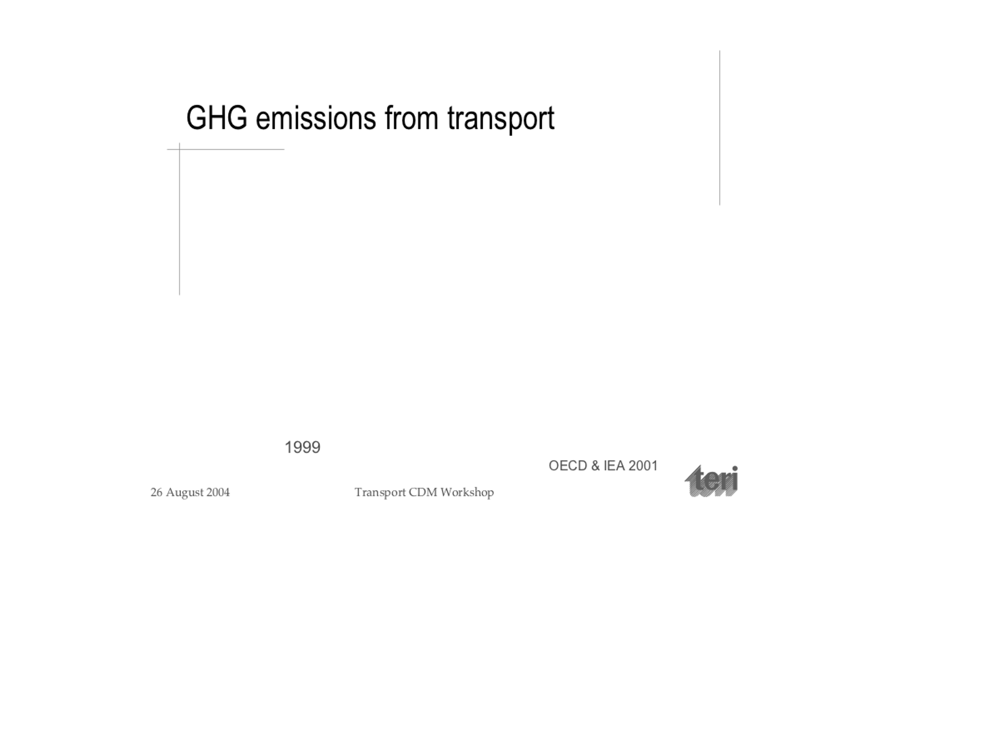


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


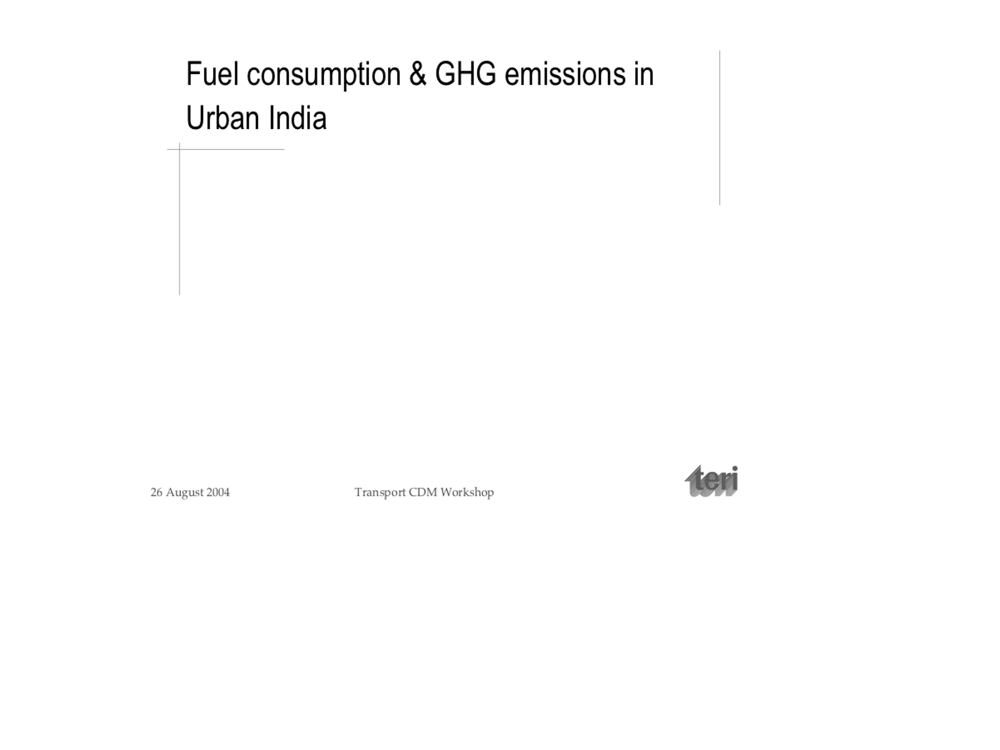


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


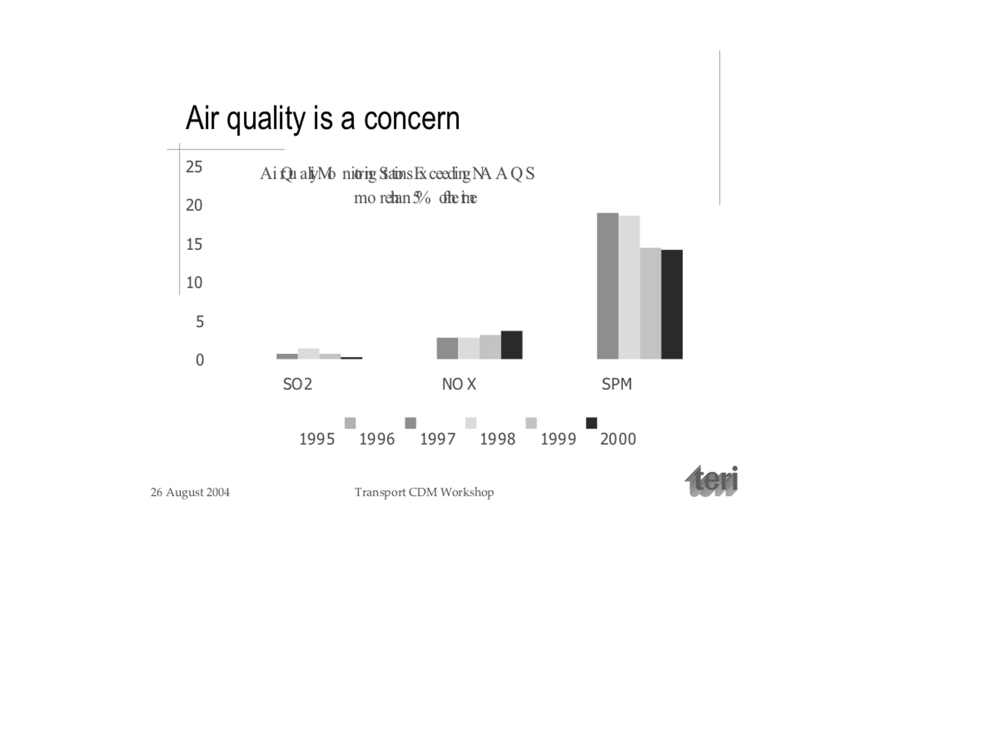


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


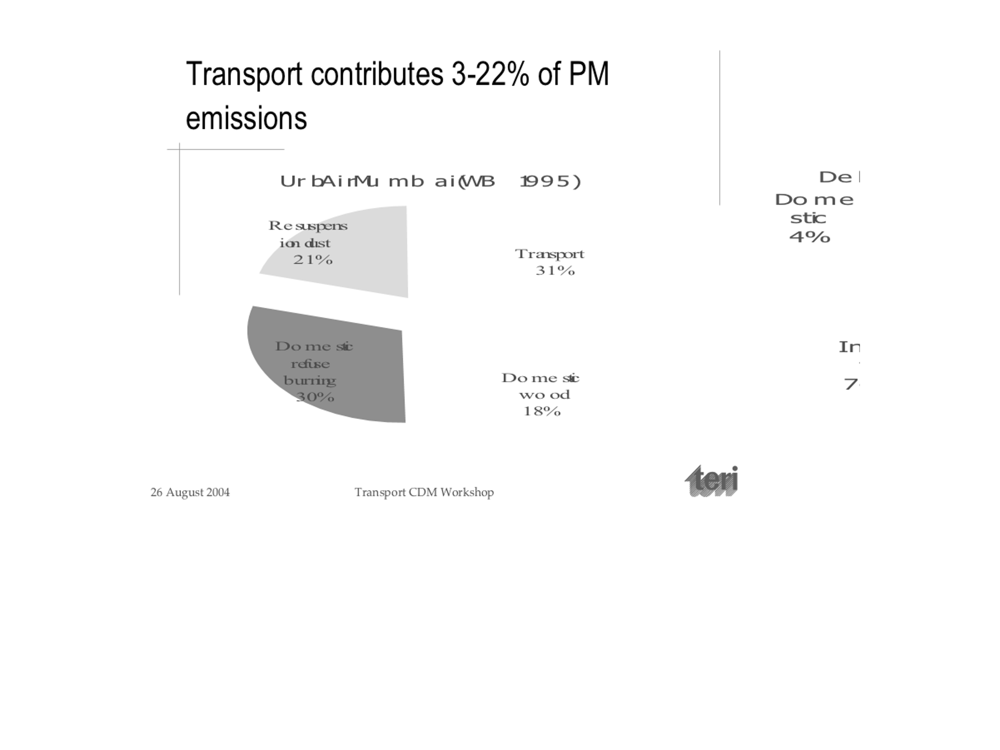


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


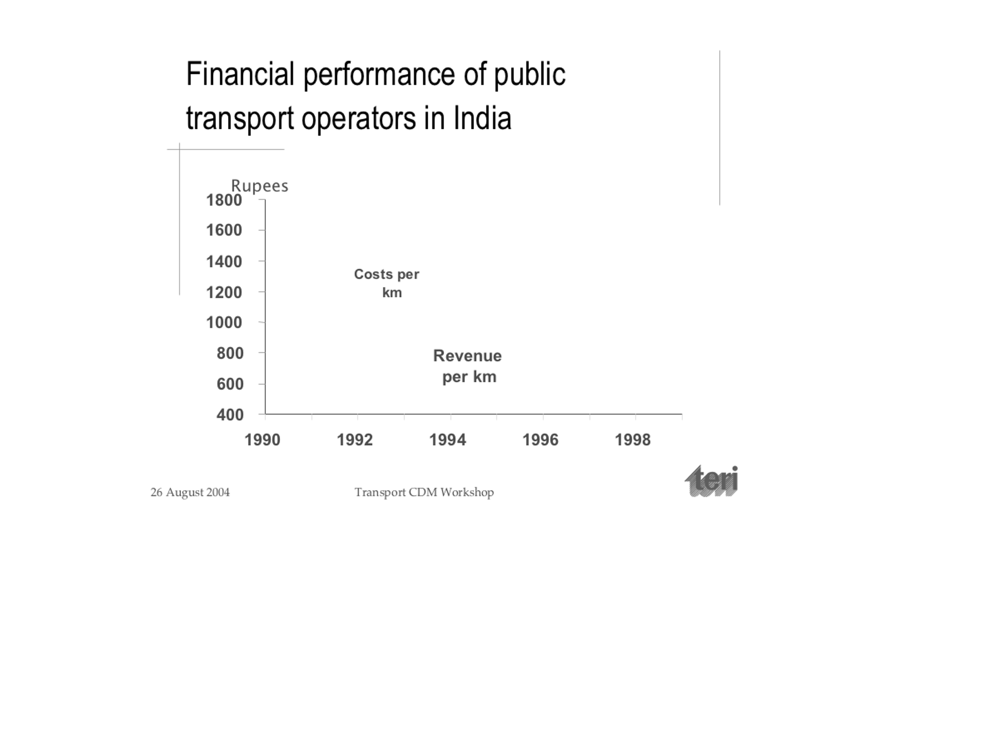


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


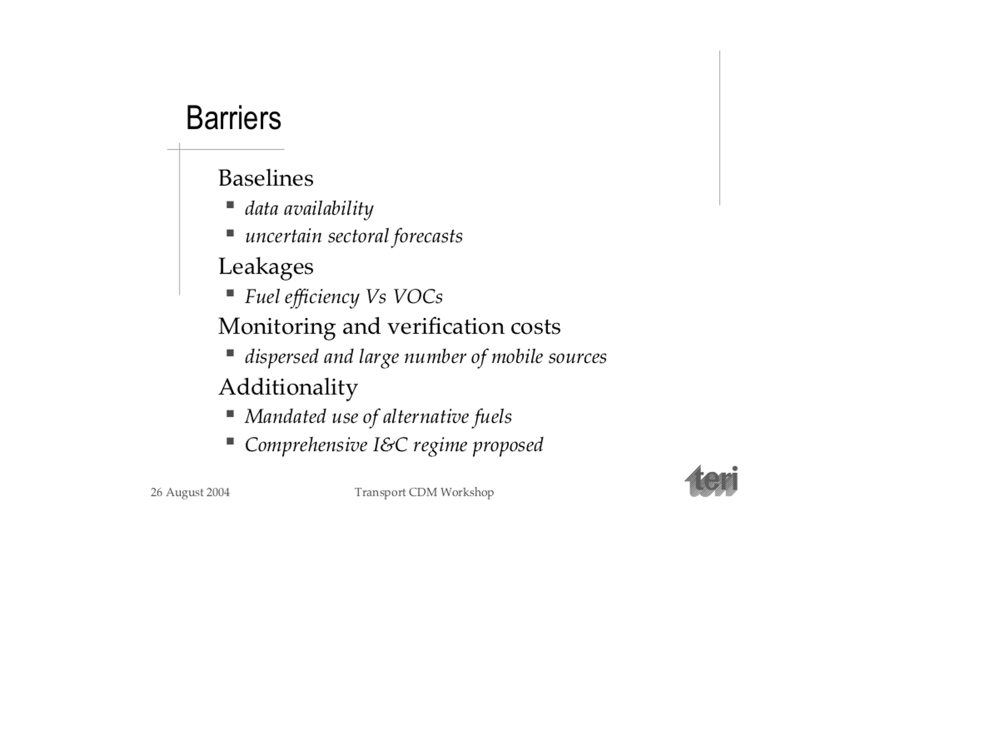


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


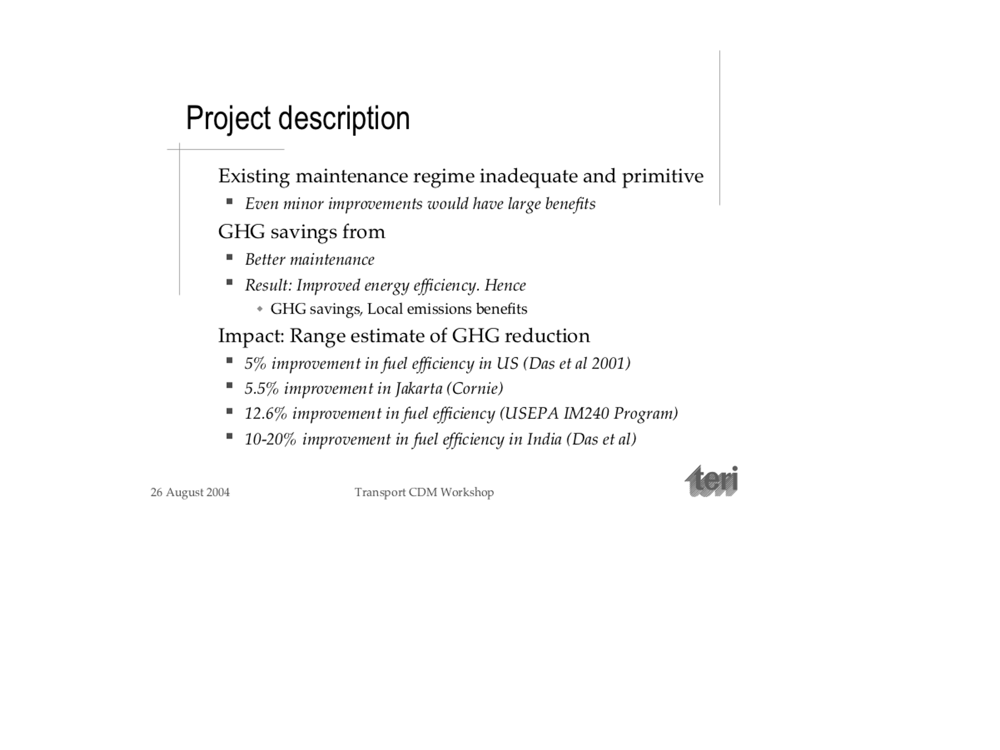


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


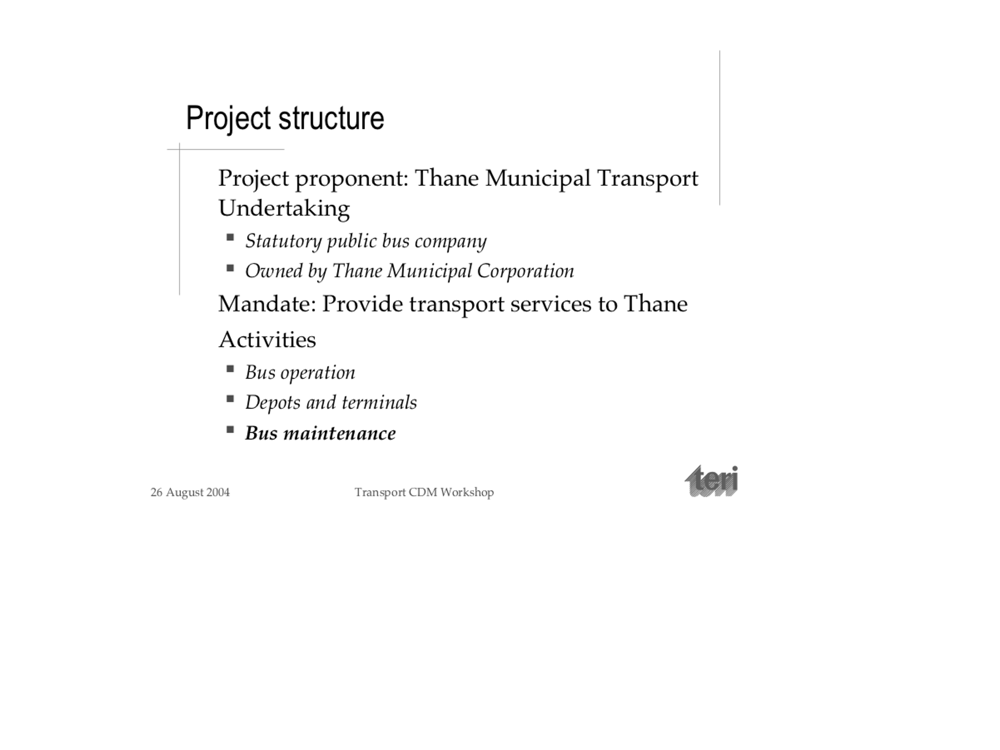


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


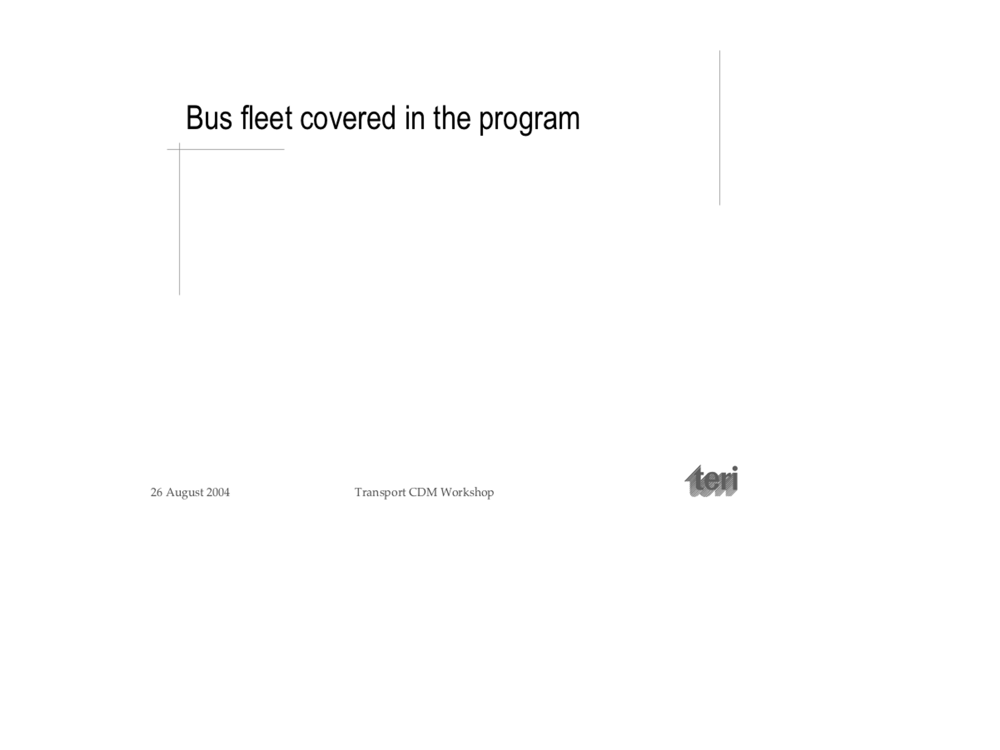


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


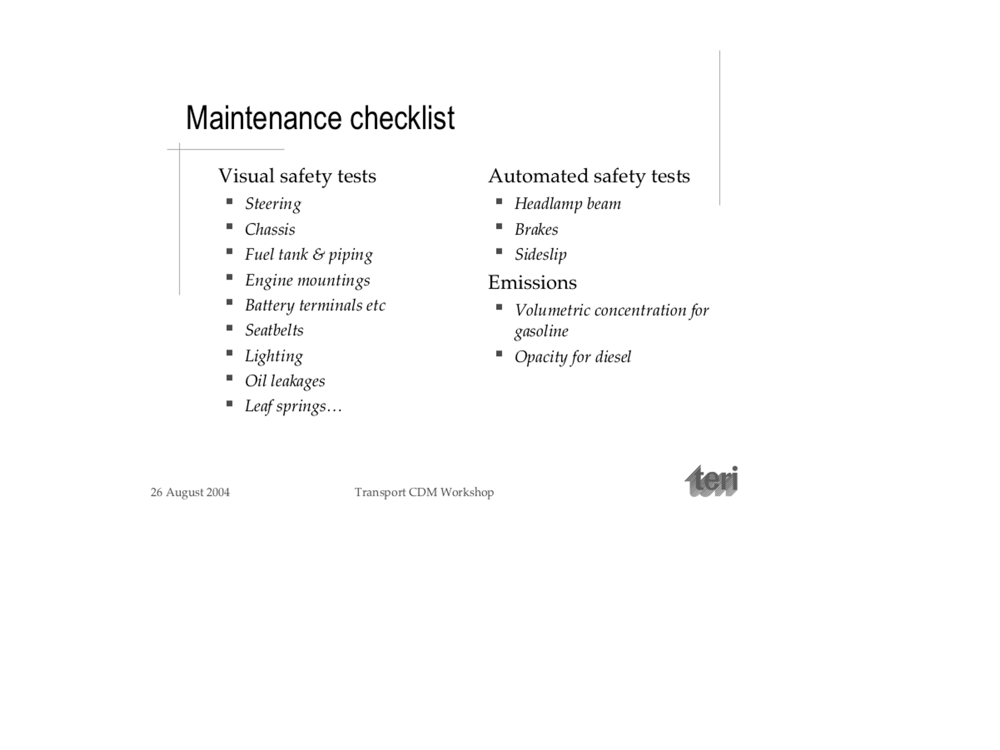


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


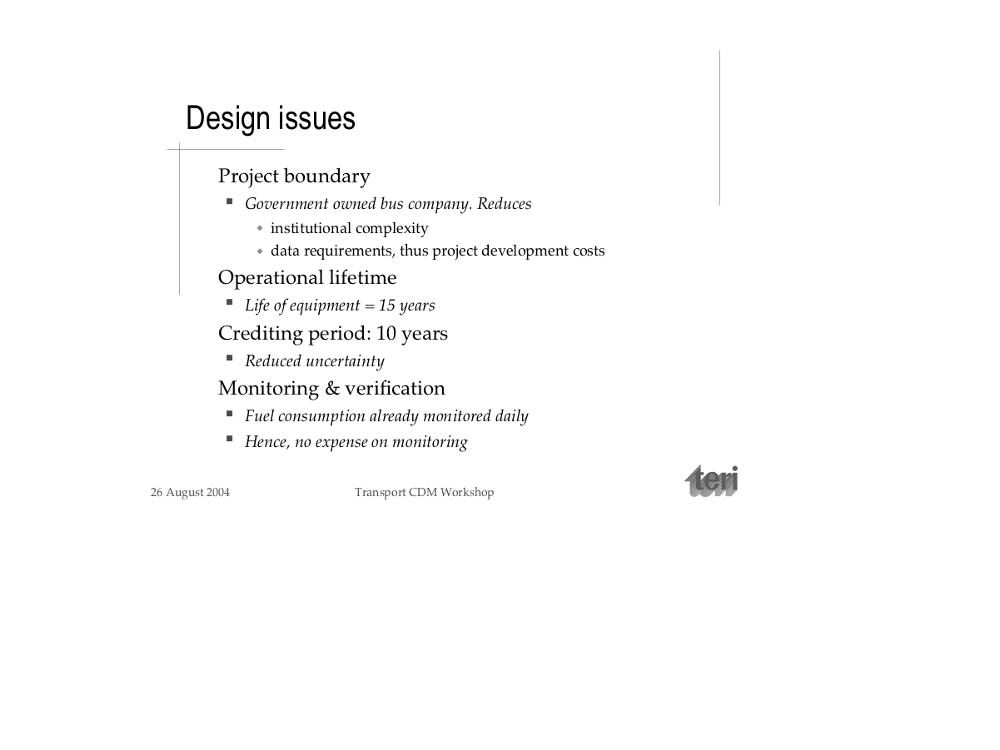


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


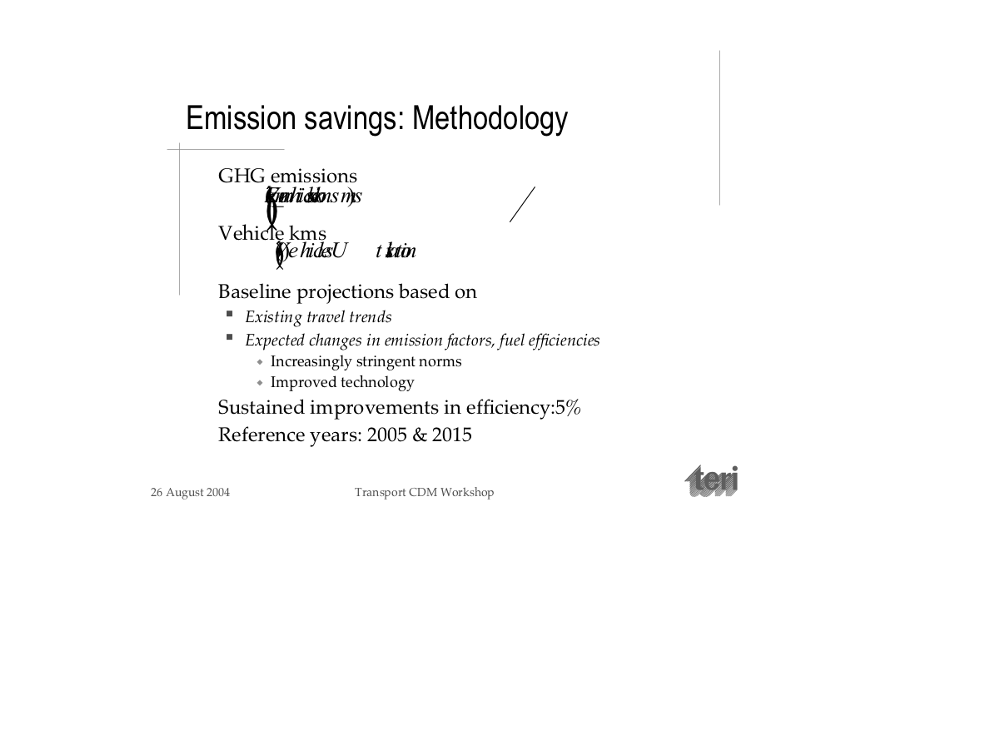


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


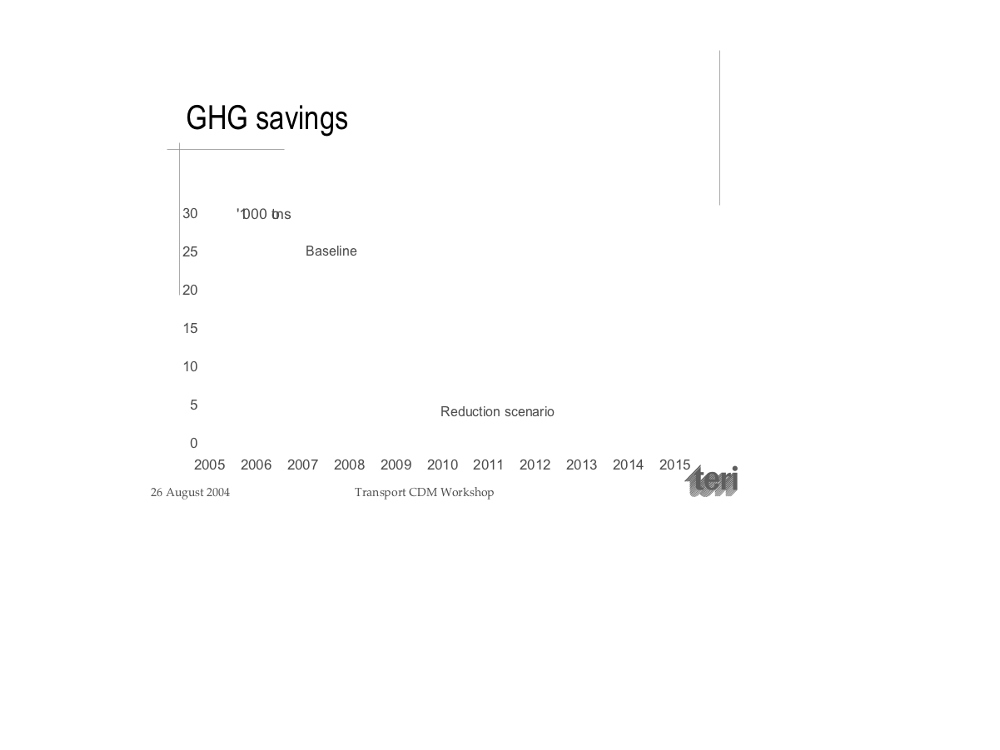


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


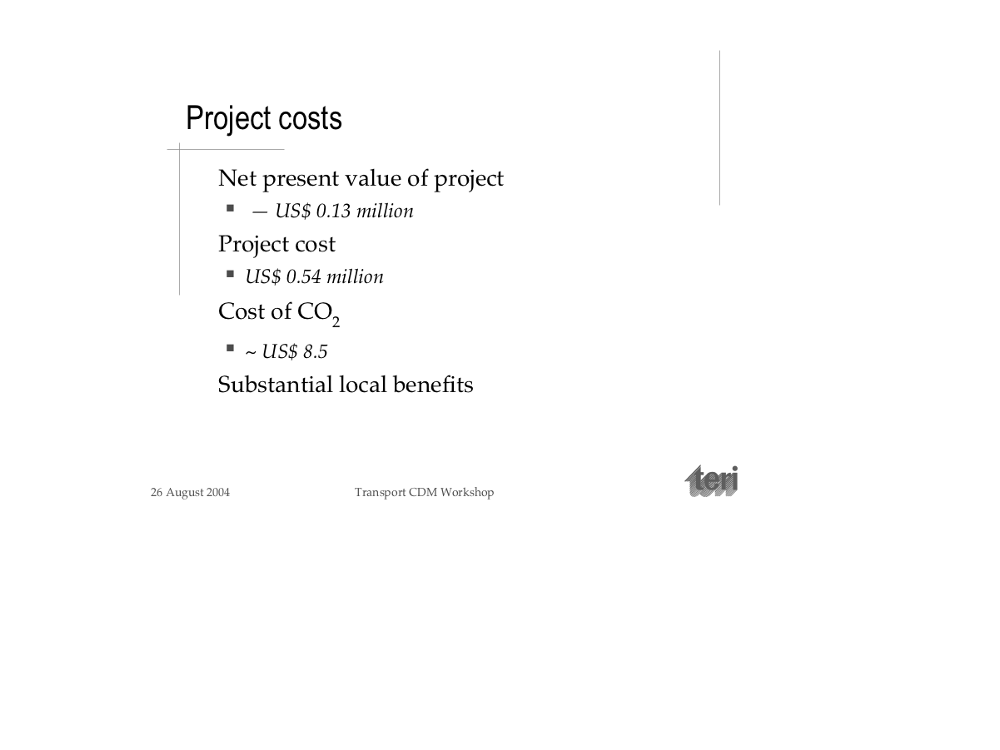


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


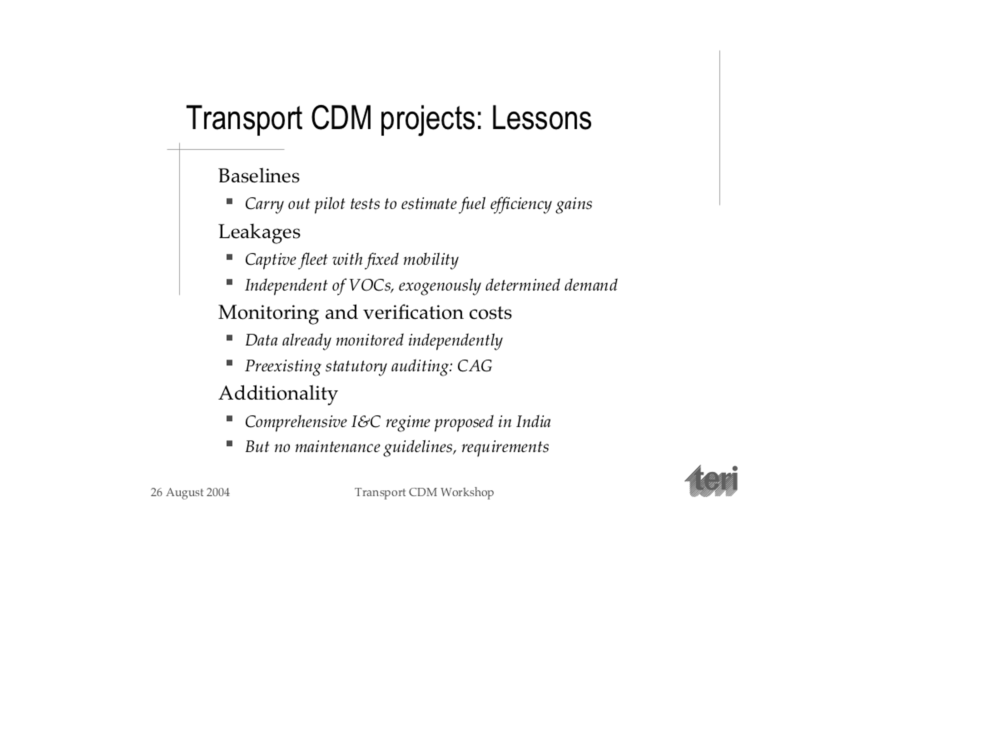


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


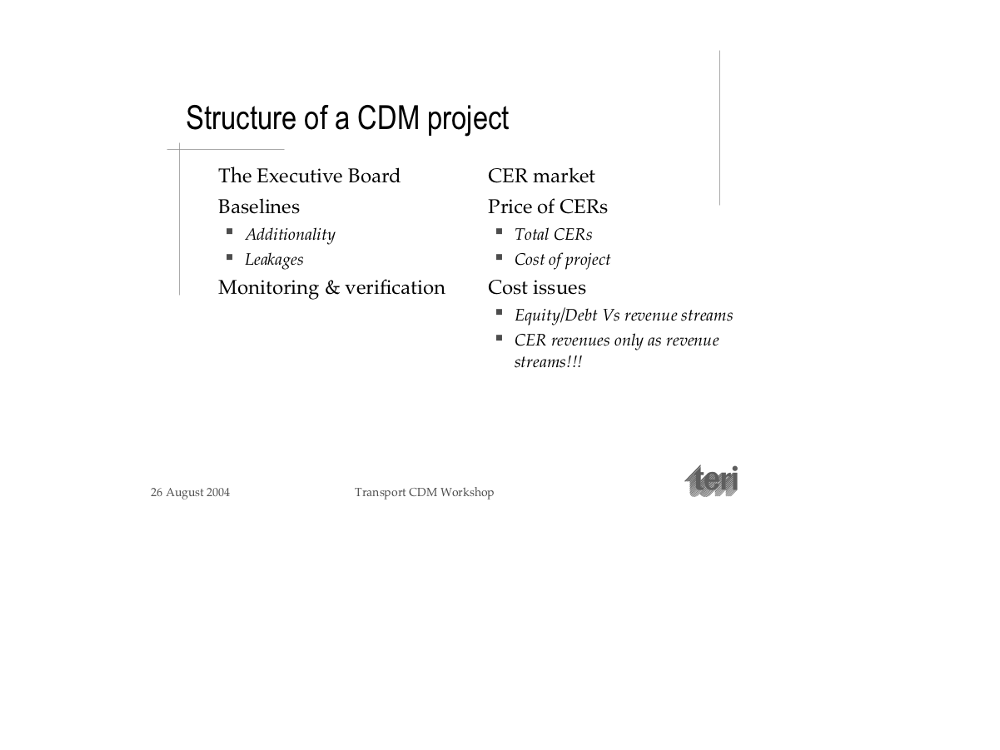


    Image #0:
    Origin: file:/Users/chico/IdeaProjects/spark-ocr/python/.venv/lib/python3.7/site-packages/sparkocr/resources/ocr/ppt/37625.pptx
    Resolution: 300 dpi
    Width: 3000 px
    Height: 2250 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


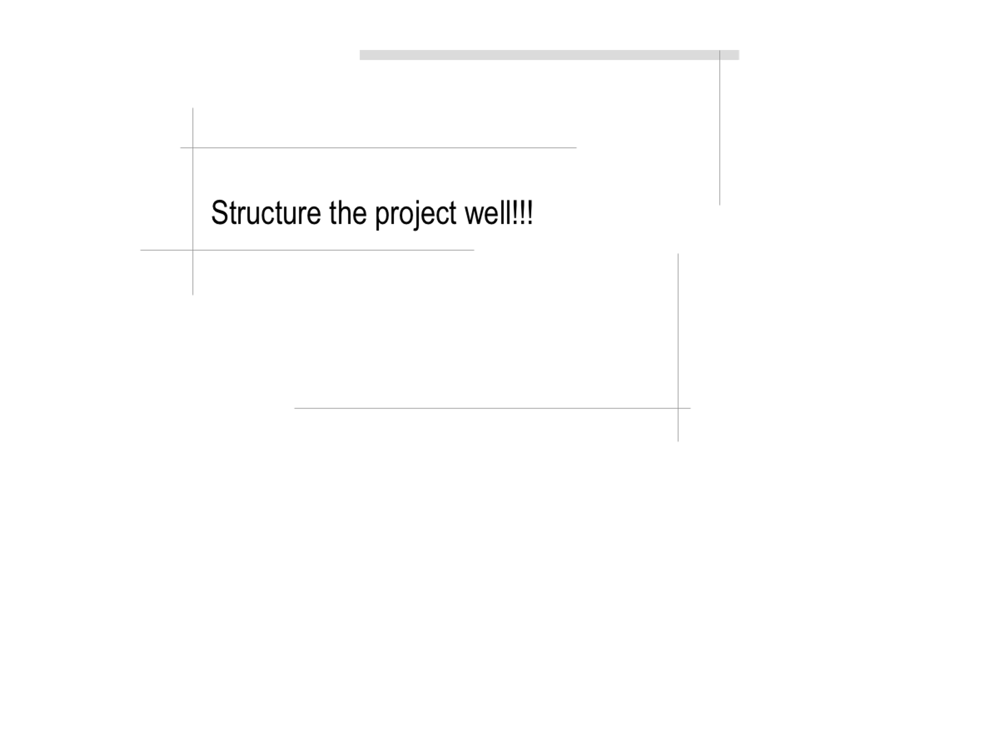

In [14]:
pptx_image_df = PdfToImage().transform(PptToPdf().setOutputCol("content").transform(pptx_example_df))
for r in pptx_image_df.select("image").collect():
    display_image(r.image)